In [1]:
import numpy as np
from scipy.special import expit
import numpyro as npr
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS
from numpyro.infer.reparam import TransformReparam
from jax import random
import jax.numpy as jnp
import jax.scipy.special as jss
import arviz as az
import matplotlib.pyplot as plt
import multiprocessing as mp
import pandas as pd
import seaborn as sns

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
sns.set()

In [4]:
npr.set_host_device_count(mp.cpu_count())

# Example from the doc

In [5]:
J = 8
y = np.array([28.0, 8.0, -3.0, 7.0, -1.0, 1.0, 18.0, 12.0])
sigma = np.array([15.0, 10.0, 16.0, 11.0, 9.0, 11.0, 10.0, 18.0])

In [6]:
def eight_schools(J, sigma, y):
    
    mu = npr.sample('mu', dist.Normal(0, 5))
    tau = npr.sample('tau', dist.HalfCauchy(5))
    with npr.plate('J', J):
        with npr.handlers.reparam(config={'theta': TransformReparam()}):
            # theta = npr.sample('theta', dist.Normal(mu, tau))
            theta = npr.sample('theta',
                               dist.TransformedDistribution(dist.Normal(0., 1.),
                                                            dist.transforms.AffineTransform(mu, tau)))
    npr.sample('obs', dist.Normal(theta, sigma), obs=y)

In [7]:
nuts_kernel = NUTS(eight_schools)
mcmc = MCMC(nuts_kernel, num_warmup=500, num_samples=1000, num_chains=1, progress_bar=True)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, J, sigma, y=y)

sample: 100%|██████████| 1500/1500 [00:06<00:00, 232.86it/s, 7 steps of size 3.79e-01. acc. prob=0.91] 


In [8]:
mcmc.print_summary() 


                   mean       std    median      5.0%     95.0%     n_eff     r_hat
           mu      4.07      3.49      3.95     -1.29     10.09    750.88      1.00
          tau      3.88      3.31      2.93      0.03      8.24    551.26      1.00
theta_base[0]      0.38      0.98      0.41     -1.30      1.83    775.55      1.00
theta_base[1]      0.13      0.94      0.16     -1.50      1.47   1245.81      1.00
theta_base[2]     -0.04      0.95     -0.03     -1.56      1.48    877.82      1.00
theta_base[3]      0.10      0.93      0.11     -1.46      1.61   1044.21      1.00
theta_base[4]     -0.10      0.94     -0.14     -1.73      1.32   1001.57      1.00
theta_base[5]     -0.10      0.93     -0.11     -1.65      1.44    902.72      1.00
theta_base[6]      0.38      0.97      0.38     -1.16      1.93    791.36      1.00
theta_base[7]      0.12      1.01      0.16     -1.68      1.58   1075.65      1.00

Number of divergences: 0


---

# Hierarchical model of forgetting

In [9]:
# def model(n_u, n_w, n_obs, u, w, d, r, y):

#     sg_w1 = npr.sample('sg_w1',  dist.InverseGamma(1, 1))
#     sg_u1 = npr.sample('sg_u1', dist.InverseGamma(1, 1))
#     sg_theta1 = npr.sample('sg_theta1', dist.InverseGamma(1, 1))
#     mu1 = npr.sample('mu1', dist.Normal(0, 10))

#     sg_w2 = npr.sample('sg_w2',  dist.InverseGamma(1, 1))
#     sg_u2 = npr.sample('sg_u2', dist.InverseGamma(1, 1))
#     sg_theta2 = npr.sample('sg_theta2', dist.InverseGamma(1, 1))
#     mu2 = npr.sample('mu2', dist.Normal(0, 10))
    
#     with npr.handlers.reparam(
#             config={'U1': TransformReparam(), 'U2': TransformReparam(),
#                     'W1': TransformReparam(), 'W2': TransformReparam(),}):
        
#         with npr.plate('users', n_u):

#             U1 = npr.sample('U1', 
#                             dist.TransformedDistribution(
#                                 dist.Normal(0., 1.),
#                                 dist.transforms.AffineTransform(0., sg_u1)))
#             U2 = npr.sample('U2', 
#                             dist.TransformedDistribution(
#                                 dist.Normal(0., 1.),
#                                 dist.transforms.AffineTransform(0., sg_u2)))

#         with npr.plate('words', n_w):
        
#             W1 = npr.sample('W1', 
#                             dist.TransformedDistribution(
#                                 dist.Normal(0., 1.),
#                                 dist.transforms.AffineTransform(0., sg_w1)))
#             W2 = npr.sample('W2', 
#                             dist.TransformedDistribution(
#                                 dist.Normal(0., 1.),
#                                 dist.transforms.AffineTransform(0., sg_w2)))

#         mu_theta1 = mu1 + U1[u] + W1[w]
#         mu_theta2 = mu2 + U2[u] + W2[w]

#         theta1 = npr.sample('theta1', 
#                        dist.TransformedDistribution(
#                             dist.Normal(0., 1.),
#                             [dist.transforms.AffineTransform(mu_theta1, sg_theta1),
#                              dist.transforms.ExpTransform()]))
#         theta2 = npr.sample('theta2',
#                        dist.TransformedDistribution(
#                             dist.Normal(0., 1.),
#                             [dist.transforms.AffineTransform(mu_theta2, sg_theta2),
#                              dist.transforms.SigmoidTransform()]))
        
#         logp = - theta1 * (1-theta2)**r * d
#         p = jnp.exp(logp)
#         logits = logp - jnp.log(1-p+jnp.finfo(float).eps)
#         npr.sample('obs', dist.Bernoulli(logits=logits), obs=y)

In [49]:
# class LogSum(npr.distributions.Distribution):
#     def __init__(self, p, *args, **kwargs):
#         self.p = p
#         super().__init__(batch_shape=(), event_shape=())

#     def log_prob(self, value):
#         return jnp.log(self.p**value*(1-self.p)**(1-value))
    
#     def _validate_sample(self, value):
#         return True

In [64]:
def model(n_u, n_w, n_obs, u, w, d, r, y):

    sg_w1 = npr.sample('sg_w1',  dist.InverseGamma(1, 1))
    sg_u1 = npr.sample('sg_u1', dist.InverseGamma(1, 1))
    sg_theta1 = npr.sample('sg_theta1', dist.InverseGamma(1, 1))
    mu1 = npr.sample('mu1', dist.Normal(0, 10))

    sg_w2 = npr.sample('sg_w2',  dist.InverseGamma(1, 1))
    sg_u2 = npr.sample('sg_u2', dist.InverseGamma(1, 1))
    sg_theta2 = npr.sample('sg_theta2', dist.InverseGamma(1, 1))
    mu2 = npr.sample('mu2', dist.Normal(0, 10))
        
    with npr.plate('users', n_u):

        U1 = npr.sample('U1', dist.Normal(0., sg_u1))
        U2 = npr.sample('U2', dist.Normal(0., sg_u2))

    with npr.plate('words', n_w):

        W1 = npr.sample('W1', dist.Normal(0., sg_w1))
        W2 = npr.sample('W2', dist.Normal(0., sg_w2))

    mu_theta1 = mu1 + U1[u] + W1[w]
    mu_theta2 = mu2 + U2[u] + W2[w]

    theta1 = npr.sample('theta1', dist.Normal(mu_theta1, sg_theta1))
    theta2 = npr.sample('theta2', dist.Normal(mu_theta2, sg_theta2))
    
    a = jnp.exp(theta1)
    b = dist.transforms.expit(theta2)
    
    logp = - a * (1-b)**r * d
    p = jnp.exp(logp) + jnp.finfo(float).eps
    # logits = logp - jnp.log(1-p+jnp.finfo(float).eps)
    # npr.sample('obs', LogSum(p), obs=y)
    npr.sample("obs", dist.Bernoulli(p), obs=y)

# Produce artificial data

## How does it look like?

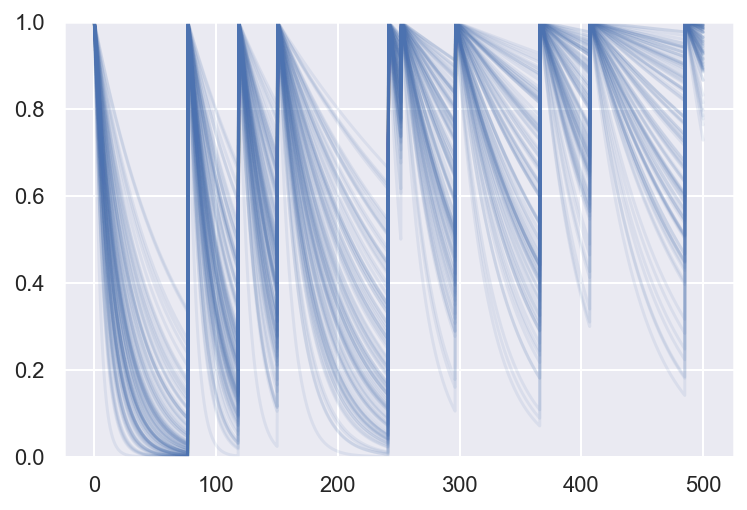

In [12]:
theta1 = np.random.normal(-3, 0.5, size=100)
theta2 = np.random.normal(-1, 0.4, size=100)

max_t = 5* 10**2
n_pres = 10

max_delay = 100

x = np.linspace(0, max_t, 1000)
pres = np.zeros(n_pres)
for i in range(1, n_pres):
    pres[i] = pres[i-1] + np.random.uniform(0, max_delay) 

n = np.zeros(x.shape)

delta = np.zeros(x.shape)
for i, p in enumerate(pres):
    delta[x>p] = x[x>p] - p
    n[x>p] = i
fig, ax = plt.subplots()

for th1, th2 in zip(theta1, theta2):
    alpha, beta = np.exp(th1), expit(th2)
    # print("alpha-beta", alpha, beta)
    p = np.exp(-alpha*(1-beta)**n*delta)
    ax.plot(x, p, color='C0', alpha=0.1)
ax.set_ylim(0, 1);

## Create a batch

In [13]:
# Seed
np.random.seed(0)

# Parameterization
mu = -4, 0.3
sg_theta = 0.001, 0.001
sg_u = 0.1, 0.1
sg_w = 0.5, 0.3

n_u = 20         # Number of users
n_w = 10         # Number of words
n_o_max = 10     # Max. number of observations for one user
delta_max = 100  # Max. time delta between two presentations

n_w_by_u = np.random.randint(3, 5, n_u)                # Number of words seen by a single user
n_o_by_u = np.random.randint(n_o_max-2, n_o_max, n_u)  # Number of observations for a single user
n_obs = n_o_by_u.sum()                                 # Total number of observations

n_param = 2
U = np.random.normal(0, sg_u, size=(n_u, n_param))   # User ability
W = np.random.normal(0, sg_w, size=(n_w, n_param))   # Item difficulty

delta = np.random.uniform(0, delta_max, size=(n_u, n_o_max))

w = np.zeros(shape=n_obs, dtype=int)
u = np.zeros(shape=n_obs, dtype=int)
r = np.zeros(shape=n_obs, dtype=int)
d = np.zeros(shape=n_obs, dtype=float)

idx = 0
for i_u in range(n_u):
    
    n_wu = n_w_by_u[i_u]
    n_ou = n_o_by_u[i_u]
    
    seen = np.random.choice(np.arange(n_w), replace=False, size=n_wu)
    w_u = np.random.choice(seen, replace=True, size=n_ou)
    counts = {word: 0 for word in seen}
    r_u = np.zeros(shape=n_ou, dtype=int)
    for i, word in enumerate(w_u):
        r_u[i] = counts[word]
        counts[word] += 1
    
    d_u = delta[i_u, :n_ou]
    
    d[idx:idx+n_ou] = d_u
    w[idx:idx+n_ou] = w_u
    r[idx:idx+n_ou] = r_u
    u[idx:idx+n_ou] = i_u
    
    idx += n_ou
    
mu_obs = mu + U[u] + W[w]
theta = np.random.normal(mu_obs, sg_theta)
a = np.exp(theta[:, 0])
b = expit(theta[:, 1])
exponent = - a *(1-b)**r * d
p = np.exp(exponent)
rd = np.random.normal(size=n_obs)
y = (p > rd).astype(int)

In [14]:
data_artificial = {'n_u': n_u, 'n_w': n_w, 'n_obs': n_obs, 
                   'u': u, 'w': w, 
                   'd': d, 'r': r,
                   'y': y}

In [15]:
print(np.mean(p), np.max(p), np.min(p))
print(np.mean(y), np.min(y), np.max(y))

0.6418018279191142 0.9971788617119843 0.040728604324842516
0.7790697674418605 0 1


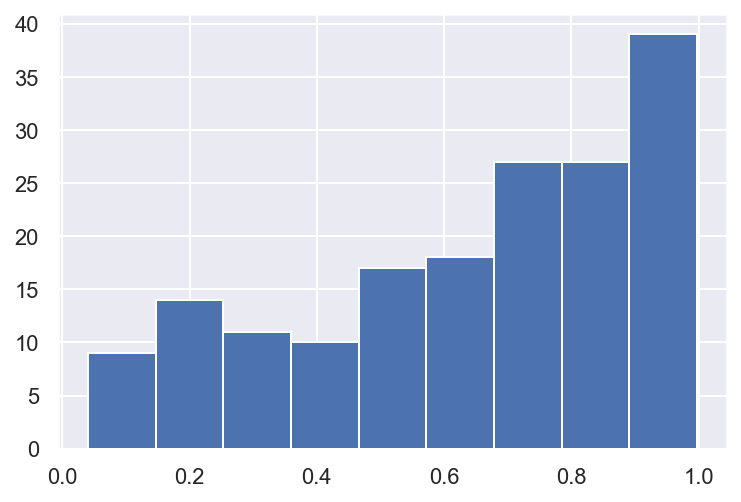

In [16]:
plt.hist(p, bins='auto');

In [17]:
np.abs(p-y).mean()

0.3806294860149697

# Run with artificial data

In [18]:
%%time
nuts_kernel = NUTS(model)
mcmc = MCMC(nuts_kernel, num_warmup=2000, num_samples=2000, num_chains=1)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, **data_artificial)

[0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1]
[0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1]


  0%|          | 0/4000 [00:00<?, ?it/s]

[0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1]


warmup:   0%|          | 1/4000 [00:07<7:48:58,  7.04s/it, 1 steps of size 2.34e+00. acc. prob=0.00]

[0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1]


sample: 100%|██████████| 4000/4000 [00:50<00:00, 79.35it/s, 81 steps of size 1.92e-02. acc. prob=0.71]   


CPU times: user 55.9 s, sys: 1.44 s, total: 57.3 s
Wall time: 53.7 s


In [19]:
mcmc.print_summary()


                 mean       std    median      5.0%     95.0%     n_eff     r_hat
      U1[0]      1.27      3.01      0.50     -2.25      7.10     51.14      1.06
      U1[1]      0.51      2.37      0.32     -3.08      5.26     99.72      1.00
      U1[2]     -0.02      2.69      0.01     -3.94      5.47     80.53      1.04
      U1[3]      1.68      3.16      0.80     -1.98      7.47     35.99      1.00
      U1[4]      1.11      2.70      0.41     -2.83      5.68     81.19      1.01
      U1[5]     -0.02      2.52     -0.05     -3.69      4.84    138.42      1.01
      U1[6]     -1.20      3.17     -0.44     -6.53      2.97     72.42      1.08
      U1[7]     -1.56      3.19     -0.72     -7.10      2.88     58.25      1.06
      U1[8]      0.89      2.40      0.34     -2.67      4.65     59.49      1.00
      U1[9]     -1.88      3.17     -0.79     -7.78      1.52     41.46      1.06
     U1[10]      0.09      2.14      0.05     -3.52      3.50    227.33      1.01
     U1[11]    

Number of divergences: 875


[0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1]
[0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1]


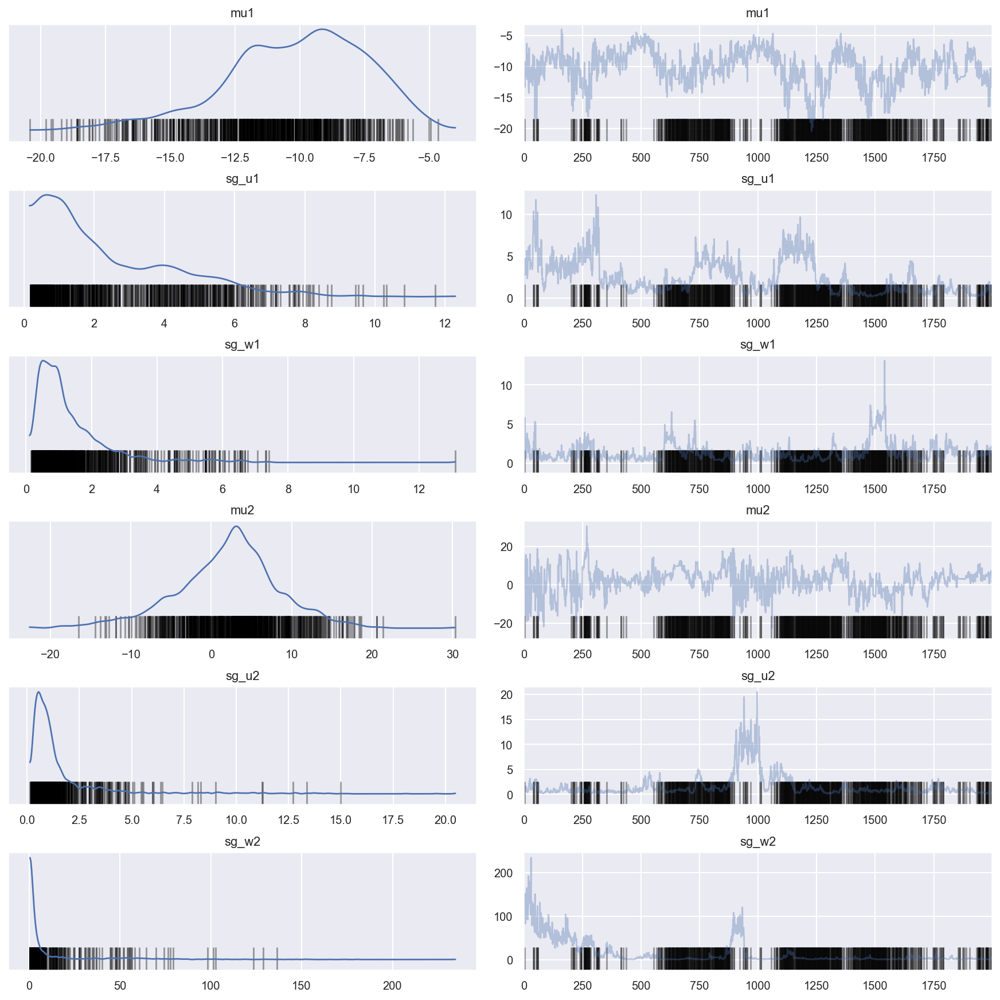

In [20]:
trace = az.from_numpyro(mcmc)
az.plot_trace(trace, var_names=['mu1', 'sg_u1', 'sg_w1', 'mu2', 'sg_u2', 'sg_w2']);

# Run with real data

In [21]:
df = pd.read_csv("data_full.csv", index_col=0)
df.drop(df[(df.domain != "active.fi") | (df.n_session_done != 14)].index, inplace=True)
df

,user,domain,condition,item,success,teacher_md,learner_md,psy_md,session,is_eval,ts_display,ts_reply,n_session_done
49739,goldfish@active.fi,active.fi,ThresholdCondition,1506,True,leitner,NaN,grid,1900,False,2020-09-30 17:51:37.666000+00:00,2020-09-30 17:51:41.042000+00:00,14
49740,goldfish@active.fi,active.fi,ThresholdCondition,190,True,leitner,NaN,grid,1900,False,2020-09-30 17:51:42.081000+00:00,2020-09-30 17:51:43.910000+00:00,14
49741,goldfish@active.fi,active.fi,ThresholdCondition,1000,True,leitner,NaN,grid,1900,False,2020-09-30 17:51:44.980000+00:00,2020-09-30 17:51:46.413000+00:00,14
49742,goldfish@active.fi,active.fi,ThresholdCondition,1506,True,leitner,NaN,grid,1900,False,2020-09-30 17:51:47.476000+00:00,2020-09-30 17:51:50.206000+00:00,14
49743,goldfish@active.fi,active.fi,ThresholdCondition,190,True,leitner,NaN,grid,1900,False,2020-09-30 17:51:51.245000+00:00,2020-09-30 17:51:53.477000+00:00,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
147617,azalea@active.fi,active.fi,ThresholdCondition,179,True,threshold,exp_decay,grid,2571,True,2020-10-08 05:52:21.524000+00:00,2020-10-08 05:52:31.640000+00:00,14
147618,azalea@active.fi,active.fi,ThresholdCondition,1071,False,threshold,exp_decay,grid,2571,True,2020-10-08 05:52:32.658000+00:00,2020-10-08 05:52:45.959000+00:00,14
147619,azalea@active.fi,active.fi,ThresholdCondition,1196,True,threshold,exp_decay,grid,2571,True,2020-10-08 05:52:48.143000+00:00,2020-10-08 05:52:51.527000+00:00,14
147620,azalea@active.fi,active.fi,ThresholdCondition,1282,True,threshold,exp_decay,grid,2571,True,2020-10-08 05:52:52.543000+00:00,2020-10-08 05:52:56.460000+00:00,14


In [22]:
df["ts_display"] = pd.to_datetime(df["ts_display"])  # str to datetime
df["ts_reply"] = pd.to_datetime(df["ts_reply"]) 

In [23]:
# Convert timestamps into seconds
beginning_history = pd.Timestamp("1970-01-01", tz="UTC")
df["timestamp"] = (df["ts_reply"] - beginning_history).dt.total_seconds().values

In [24]:
n_u = len(df.user.unique())
n_w = len(df.item.unique())
print(f"n_u={n_u}, n_w={n_w}" )

n_u=53, n_w=1998


In [25]:
# Copy actual item ID
df["item_id"] = df.item

In [26]:
for i, i_id in enumerate(df.item_id.unique()): 
    df.loc[df.item_id == i_id, 'item'] = i

In [27]:
print(df.item.min())
print(df.item.max())

0
1997


In [28]:
n_o_by_u = np.zeros(shape=n_u, dtype=int)
for u, (user, user_df) in enumerate(df.groupby("user")):
    n_o_by_u[u] = len(user_df) - len(user_df.item.unique()) # Do not count first presentation
n_o_max = n_o_by_u.max()
n_obs = n_o_by_u.sum()
print( f"n_o_max={n_o_max}")
print(f"n_o_min={n_o_by_u.min()}")
print(f"n_obs={n_obs}")

n_o_max=1404
n_o_min=1285
n_obs=70618


In [53]:
y = np.zeros(shape=n_obs, dtype=int)
d = np.zeros(shape=n_obs, dtype=float)
w = np.zeros(shape=n_obs, dtype=int)
r = np.zeros(shape=n_obs, dtype=int)
u = np.zeros(shape=n_obs, dtype=int)

idx = 0

for i_u, (user, user_df) in enumerate(df.groupby("user")):
    
    user_df = user_df.sort_values(by="timestamp")
    seen = user_df.item.unique()
    w_u = user_df.item.values      # Words
    ts_u = user_df.timestamp.values
    counts = {word: -1 for word in seen}
    last_pres = {word: None for word in seen}
    r_u = np.zeros(len(user_df))   # Number of repetitions
    d_u = np.zeros(r_u.shape)      # Time elapsed since last repetition 
    for i, word in enumerate(w_u):
        ts = ts_u[i]
        r_u[i] = counts[word]
        if last_pres[word] is not None:
            d_u[i] =  ts - last_pres[word]
        counts[word] += 1
        last_pres[word] = ts
    
    to_keep = r_u >= 0
    y_u = user_df.success.values[to_keep]
    r_u = r_u[to_keep]
    w_u = w_u[to_keep]
    d_u = d_u[to_keep]
    
    n_ou = len(y_u)
    # assert n_o_by_u[i_u] == n_ou
    
    y[idx:idx+n_ou] = y_u
    d[idx:idx+n_ou] = d_u
    w[idx:idx+n_ou] = w_u
    r[idx:idx+n_ou] = r_u
    u[idx:idx+n_ou] = i_u
    
    idx += n_ou

data = {'n_u': len(np.unique(u)), 'n_w': len(np.unique(w)), 'n_obs': len(y),
        'u': u, 'w': w, 
        'd': d, 'r': r,
        'y': y}

print("n obs", len(y))
print("mean success", y.mean())
print("y contains nan", np.isnan(y.sum()))
print("d contains nan", np.isnan(d.sum()))
print("r contains nan", np.isnan(r.sum()))
print("w contains nan", np.isnan(w.sum()))
print("u contains nan", np.isnan(u.sum()))
print("n_u is nan", np.isnan(n_u))
print("n_w is nan", np.isnan(n_w))
print("n_obs is nan", np.isnan(n_obs))
print("min/max d", np.min(d), np.max(d))
print("min/max r", np.min(r), np.max(r))

n obs 70618
mean success 0.8626837350250645
y contains nan False
d contains nan False
r contains nan False
w contains nan False
u contains nan False
n_u is nan False
n_w is nan False
n_obs is nan False
min/max d 1.7849998474121094 476175.66499996185
min/max r 0 213


In [61]:
from numpyro.infer.initialization import init_to_median

In [65]:
nuts_kernel = NUTS(model, init_strategy=init_to_median())
mcmc = MCMC(nuts_kernel, num_warmup=2000, num_samples=2000, num_chains=1)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, **data)

sample: 100%|██████████| 4000/4000 [4:16:00<00:00,  3.84s/it, 511 steps of size 5.46e-03. acc. prob=0.83]   


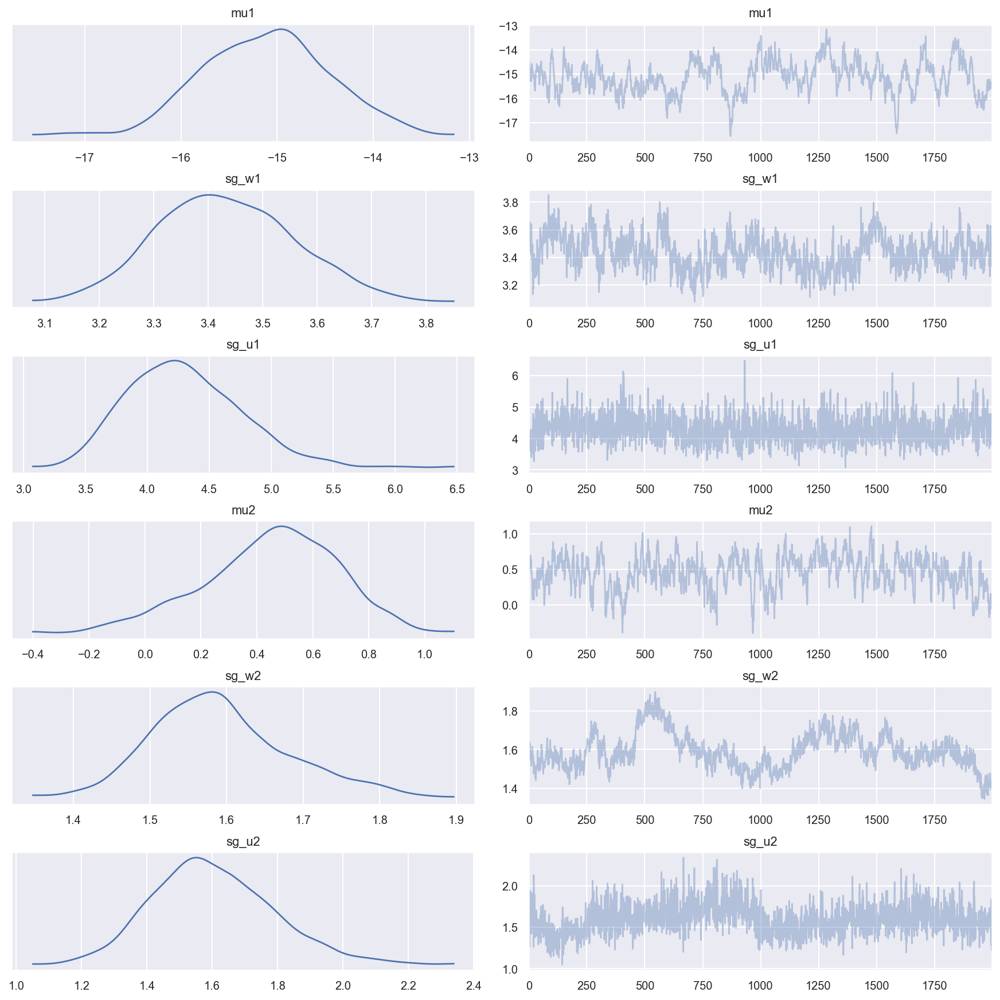

In [66]:
trace = az.from_numpyro(mcmc)
az.plot_trace(trace, var_names=['mu1', 'sg_w1', 'sg_u1', 'mu2', 'sg_w2', 'sg_u2']);

In [67]:
mcmc.print_summary()


                   mean       std    median      5.0%     95.0%     n_eff     r_hat
        U1[0]     -3.32      1.30     -3.36     -5.36     -1.20     36.84      1.02
        U1[1]     -2.89      0.89     -2.93     -4.38     -1.48     52.81      1.00
        U1[2]     -2.17      1.11     -2.26     -3.96     -0.43     30.98      1.01
        U1[3]     11.34      0.95     11.35      9.69     12.85     45.72      1.02
        U1[4]      1.30      0.91      1.23     -0.26      2.75     47.53      1.00
        U1[5]     -3.28      1.41     -3.11     -5.66     -1.12     13.24      1.03
        U1[6]      3.99      0.93      3.95      2.43      5.47     36.53      1.00
        U1[7]      2.74      1.07      2.65      1.19      4.44     40.11      1.02
        U1[8]     -0.50      0.89     -0.53     -2.06      0.87     52.26      1.02
        U1[9]      3.91      1.04      3.93      2.31      5.76     33.14      1.01
       U1[10]      4.49      0.98      4.42      3.02      6.17     57.63  

     W1[1348]     -1.50      2.52     -1.54     -5.13      3.13    268.19      1.00
     W1[1349]      5.55      2.14      5.51      1.75      8.86    102.83      1.02
     W1[1350]      3.25      1.78      3.22      0.38      6.11    112.59      1.01
     W1[1351]      1.21      2.14      1.16     -1.99      4.98    167.67      1.02
     W1[1352]      4.72      2.31      4.70      1.22      8.67    136.62      1.00
     W1[1353]      0.01      2.66      0.03     -4.39      4.32    189.00      1.00
     W1[1354]      4.23      2.05      4.14      0.94      7.70     91.10      1.00
     W1[1355]      3.35      1.93      3.26      0.11      6.47    109.50      1.04
     W1[1356]      0.56      2.21      0.53     -3.03      4.22    189.38      1.00
     W1[1357]      1.24      2.44      1.15     -2.78      5.13    248.73      1.00
     W1[1358]      1.60      2.27      1.64     -1.75      5.63    115.99      1.01
     W1[1359]     -2.64      2.75     -2.66     -7.07      1.83    131.19   

      W2[350]      0.40      1.30      0.42     -1.91      2.40     28.50      1.05
      W2[351]      0.72      1.45      0.72     -1.72      3.02    220.90      1.01
      W2[352]      2.42      1.53      2.51      0.08      5.09     77.70      1.03
      W2[353]      0.29      1.36      0.29     -2.06      2.54     70.99      1.00
      W2[354]     -0.21      1.45     -0.14     -2.60      2.23    125.90      1.00
      W2[355]      0.13      1.22      0.21     -1.76      2.17    175.66      1.00
      W2[356]     -0.18      1.23     -0.14     -2.09      1.90    225.68      1.00
      W2[357]     -0.57      1.16     -0.42     -2.50      1.32     58.85      1.03
      W2[358]     -0.43      1.09     -0.36     -2.17      1.31    103.16      1.01
      W2[359]      0.06      1.25      0.20     -2.22      1.91     53.70      1.01
      W2[360]     -0.44      1.04     -0.35     -2.33      1.17     48.32      1.00
      W2[361]      0.35      1.10      0.36     -1.36      2.22     79.50   

     W2[1733]     -1.22      1.19     -1.11     -3.16      0.81    108.73      1.01
     W2[1734]      0.48      1.38      0.46     -1.57      2.89    156.50      1.00
     W2[1735]      0.06      1.63      0.06     -2.41      2.92    234.79      1.00
     W2[1736]      0.25      1.63      0.32     -2.20      3.04    190.42      1.00
     W2[1737]      0.90      1.21      0.93     -1.08      2.90    169.46      1.00
     W2[1738]      0.81      1.48      0.79     -1.63      3.31    140.08      1.00
     W2[1739]     -0.17      1.19     -0.18     -2.13      1.81    135.89      1.02
     W2[1740]     -1.20      1.28     -1.18     -3.19      0.95    139.92      1.02
     W2[1741]     -0.48      1.36     -0.44     -2.51      1.89    149.55      1.00
     W2[1742]     -0.14      1.09     -0.08     -1.94      1.68     84.26      1.00
     W2[1743]      0.54      1.49      0.53     -2.01      2.91    233.34      1.00
     W2[1744]     -0.07      1.13     -0.03     -1.83      1.84    104.64   

  theta1[843]    -18.45      8.19    -18.16    -30.40     -3.77    905.84      1.00
  theta1[844]    -21.12      9.13    -21.13    -35.63     -5.91    811.69      1.00
  theta1[845]    -21.61      8.23    -21.69    -35.95     -8.57    908.03      1.00
  theta1[846]    -18.88      8.85    -18.94    -32.94     -3.82    828.29      1.00
  theta1[847]    -17.78      8.47    -17.67    -31.81     -4.44    740.68      1.00
  theta1[848]    -20.74      8.08    -20.52    -33.36     -7.02   1030.18      1.00
  theta1[849]    -20.97      8.69    -20.71    -33.90     -5.76   1103.29      1.00
  theta1[850]    -18.26      8.65    -17.70    -31.80     -4.20   1029.51      1.00
  theta1[851]    -21.68      9.13    -21.88    -35.15     -5.16    896.16      1.00
  theta1[852]    -20.29      8.29    -20.02    -34.17     -6.94   1009.41      1.00
  theta1[853]    -20.79      8.66    -20.37    -34.80     -6.26    713.30      1.00
  theta1[854]    -20.85      8.39    -20.56    -33.52     -6.38    953.71   

 theta1[2342]    -18.02      7.96    -17.78    -31.25     -6.28    932.31      1.00
 theta1[2343]    -20.23      8.13    -19.73    -31.96     -5.66   1065.39      1.00
 theta1[2344]    -18.10      8.08    -17.62    -30.76     -4.70    567.47      1.01
 theta1[2345]    -16.97      7.11    -16.43    -28.20     -6.12    936.54      1.00
 theta1[2346]    -19.18      8.08    -18.55    -30.67     -5.31   1080.51      1.00
 theta1[2347]    -17.31      7.49    -16.82    -27.83     -3.86   1050.54      1.00
 theta1[2348]    -15.47      7.35    -14.71    -26.09     -3.15   1040.55      1.00
 theta1[2349]    -19.80      7.93    -19.59    -31.58     -5.85    866.03      1.00
 theta1[2350]    -18.90      8.03    -18.58    -30.65     -4.88   1092.20      1.00
 theta1[2351]    -17.58      7.67    -16.90    -29.01     -4.79    796.30      1.00
 theta1[2352]    -20.85      8.15    -20.63    -32.94     -6.95   1089.85      1.00
 theta1[2353]    -19.25      7.97    -19.30    -32.89     -6.98   1050.85   

 theta1[3842]    -20.49      6.84    -19.75    -31.40     -9.95    688.65      1.00
 theta1[3843]    -22.60      8.54    -22.67    -36.58     -8.71    685.87      1.01
 theta1[3844]    -21.43      8.12    -20.95    -34.28     -8.50    794.50      1.01
 theta1[3845]     -5.18      4.91     -6.10    -12.35      2.88    969.52      1.00
 theta1[3846]    -19.17      7.62    -18.57    -31.93     -7.13    859.63      1.00
 theta1[3847]    -23.31      7.62    -22.84    -34.40     -9.97    650.64      1.00
 theta1[3848]    -19.96      7.03    -19.17    -31.75     -9.31    812.23      1.00
 theta1[3849]    -22.67      7.69    -22.10    -34.84    -10.22    689.20      1.00
 theta1[3850]    -15.96      7.55    -15.62    -28.40     -3.79    550.85      1.01
 theta1[3851]    -22.77      8.05    -21.90    -34.39     -9.27    831.06      1.01
 theta1[3852]    -21.99      7.92    -21.70    -34.69     -9.24    719.47      1.01
 theta1[3853]     -5.39      5.27     -6.59    -12.42      2.83    832.38   

 theta1[5341]     -1.21      8.51     -1.31    -15.21     12.43    566.67      1.00
 theta1[5342]     -6.19      8.16     -6.45    -18.57      8.39    407.16      1.00
 theta1[5343]      3.96      6.36      3.14     -6.00     13.52    696.19      1.00
 theta1[5344]      8.28      6.74      7.87     -2.73     19.76    472.35      1.00
 theta1[5345]     -1.85      8.30     -1.61    -15.13     12.16    743.52      1.00
 theta1[5346]     -8.91      7.08     -8.32    -21.07      2.14    607.64      1.00
 theta1[5347]     -2.25      8.60     -2.05    -15.12     12.57    551.14      1.00
 theta1[5348]     -8.72      7.61     -8.45    -21.59      3.46    507.53      1.00
 theta1[5349]     -3.33      9.04     -3.05    -17.13     12.59    741.70      1.00
 theta1[5350]    -10.57      7.51    -10.29    -22.15      2.48    746.00      1.00
 theta1[5351]     -3.23      8.49     -3.38    -17.07     10.24    881.79      1.00
 theta1[5352]     -5.68      8.43     -5.82    -21.28      6.48    600.04   

 theta1[6841]    -21.35      7.51    -20.22    -33.17     -9.67    532.42      1.00
 theta1[6842]    -18.83      6.78    -17.91    -29.28     -8.68    834.61      1.00
 theta1[6843]    -22.15      7.58    -21.46    -33.44     -9.72    630.44      1.00
 theta1[6844]    -20.18      7.13    -19.44    -31.03     -9.37    590.81      1.00
 theta1[6845]    -20.60      7.02    -19.97    -31.49     -9.27    688.22      1.00
 theta1[6846]     -5.69      4.20     -6.37    -11.88      1.01    819.23      1.00
 theta1[6847]    -20.08      6.59    -19.31    -30.31     -9.67    874.18      1.00
 theta1[6848]    -18.18      8.10    -18.11    -31.03     -4.60    510.59      1.00
 theta1[6849]    -20.16      8.52    -19.69    -35.55     -7.24    159.88      1.00
 theta1[6850]    -19.63      8.00    -19.33    -32.21     -6.15    760.60      1.00
 theta1[6851]    -20.19      6.94    -19.56    -31.87     -9.66    760.37      1.00
 theta1[6852]     -5.08      4.41     -5.79    -11.79      1.94    548.51   

 theta1[8340]    -11.19      6.69    -10.39    -23.13     -1.56    807.66      1.00
 theta1[8341]    -13.66      6.84    -12.83    -24.76     -3.40    871.04      1.00
 theta1[8342]      1.90      5.25      1.00     -5.23     10.28    654.15      1.00
 theta1[8343]      1.20      5.21      0.20     -6.59      9.13    835.88      1.00
 theta1[8344]     -0.34      4.38     -1.06     -6.85      6.36    472.41      1.00
 theta1[8345]      1.27      4.88      0.25     -5.99      8.55    789.18      1.00
 theta1[8346]    -14.54      6.40    -13.47    -24.23     -5.66    785.63      1.00
 theta1[8347]    -11.19      6.29    -10.63    -22.13     -2.07    608.40      1.00
 theta1[8348]    -14.53      6.09    -13.54    -23.34     -5.18    897.57      1.00
 theta1[8349]    -14.62      7.10    -13.91    -26.08     -3.13    829.86      1.00
 theta1[8350]      2.47      5.16      1.59     -5.19      9.96    758.87      1.00
 theta1[8351]      1.59      4.59      0.80     -4.93      8.95    758.63   

 theta1[9477]    -17.81      7.90    -17.40    -28.99     -4.14    895.79      1.00
 theta1[9478]    -13.51      7.05    -12.98    -24.85     -2.86    670.97      1.01
 theta1[9479]    -14.09      7.94    -13.68    -26.60     -1.41    660.88      1.00
 theta1[9480]    -12.90      6.26    -12.13    -22.29     -3.49    695.57      1.00
 theta1[9481]    -17.01      8.09    -16.68    -28.58     -2.83   1048.78      1.00
 theta1[9482]    -13.20      6.71    -12.12    -23.05     -2.42    804.42      1.00
 theta1[9483]    -11.98      7.62    -11.54    -23.94      0.66    652.76      1.00
 theta1[9484]    -12.48      6.59    -11.58    -22.54     -2.49    531.53      1.00
 theta1[9485]    -16.28      8.04    -15.72    -29.54     -3.54    842.08      1.00
 theta1[9486]    -15.69      7.72    -15.03    -27.71     -3.03    803.16      1.01
 theta1[9487]    -16.97      8.20    -16.86    -30.68     -3.90    851.77      1.00
 theta1[9488]    -17.42      8.25    -17.13    -30.41     -3.66    741.20   

theta1[10800]     -5.30      4.77     -6.14    -12.29      2.64    841.46      1.00
theta1[10801]     -4.17      5.50     -5.16    -11.46      5.22    767.51      1.00
theta1[10802]    -21.08      7.48    -20.54    -33.00     -9.76   1025.06      1.00
theta1[10803]    -20.63      7.21    -20.02    -32.04     -8.92    565.69      1.00
theta1[10804]    -19.24      6.08    -18.08    -28.39    -10.30    680.67      1.00
theta1[10805]     -4.76      4.60     -5.37    -11.41      3.23    423.80      1.00
theta1[10806]    -18.22      6.80    -17.88    -28.80     -7.49    751.89      1.00
theta1[10807]    -20.31      6.48    -19.41    -30.28    -10.49    920.44      1.00
theta1[10808]    -20.26      6.92    -19.48    -31.08     -9.12    912.82      1.00
theta1[10809]    -19.93      7.43    -19.12    -31.55     -8.03    671.96      1.00
theta1[10810]    -18.67      6.39    -17.71    -29.00     -9.12    775.87      1.00
theta1[10811]    -20.28      7.07    -19.68    -32.12     -9.46    696.89   

theta1[11796]    -17.64      7.98    -16.98    -30.20     -4.73   1101.65      1.00
theta1[11797]     -0.49      4.45     -1.29     -7.00      6.86    669.04      1.00
theta1[11798]    -21.11      8.94    -20.91    -35.09     -6.35    611.79      1.00
theta1[11799]    -16.75      8.61    -16.53    -31.44     -2.88    950.95      1.00
theta1[11800]    -16.42      8.64    -16.25    -31.19     -2.89    885.26      1.00
theta1[11801]    -13.71      7.12    -13.15    -26.08     -2.93    590.74      1.00
theta1[11802]    -17.30      8.69    -17.01    -30.50     -2.54    810.97      1.00
theta1[11803]    -16.36      7.80    -15.87    -28.99     -4.36    964.91      1.00
theta1[11804]    -19.89      8.39    -19.79    -32.00     -5.37   1036.81      1.00
theta1[11805]    -17.85      7.86    -17.18    -29.96     -5.45    962.34      1.00
theta1[11806]    -14.39      8.10    -14.29    -27.75     -1.06    713.63      1.00
theta1[11807]     -0.04      4.61     -0.76     -7.25      7.15    443.12   

theta1[13246]    -14.00      8.16    -13.86    -27.05     -0.78   1003.03      1.00
theta1[13247]     -0.14      6.23     -0.91    -10.06      9.46    520.65      1.00
theta1[13248]     -8.74      8.45     -8.91    -22.45      4.86   1096.83      1.00
theta1[13249]    -11.16      8.21    -11.42    -25.15      1.88    850.22      1.00
theta1[13250]     -3.54      5.72     -4.28    -12.61      5.02   1020.26      1.00
theta1[13251]    -14.51      9.05    -14.42    -28.40      0.49    497.57      1.00
theta1[13252]    -12.44      8.07    -12.69    -25.10      1.84    482.69      1.00
theta1[13253]    -10.36      8.79    -10.42    -25.46      3.47    589.20      1.00
theta1[13254]    -11.70      8.32    -11.58    -24.79      2.18    567.80      1.00
theta1[13255]    -10.90      7.94    -11.09    -23.91      2.63    499.00      1.00
theta1[13256]    -11.93      8.60    -11.33    -26.76      1.14    364.74      1.00
theta1[13257]    -13.32      7.72    -13.29    -27.08     -1.78    270.53   

theta1[14504]    -17.58      8.00    -17.15    -31.03     -5.28    526.39      1.01
theta1[14505]     -4.22      5.62     -5.11    -12.37      4.64   1052.04      1.00
theta1[14506]     -0.17      6.39     -0.60    -10.54      9.87    494.91      1.00
theta1[14507]    -15.05      6.16    -14.67    -25.10     -4.86    407.61      1.00
theta1[14508]    -17.17      5.97    -16.42    -27.97     -8.46    771.14      1.00
theta1[14509]     -7.48      8.53     -7.85    -21.89      6.11    569.73      1.00
theta1[14510]    -17.17      4.56    -16.20    -24.07    -10.58    693.87      1.00
theta1[14511]    -13.13      7.77    -12.93    -26.34     -0.37    291.22      1.01
theta1[14512]     -4.14      5.75     -5.22    -12.21      4.51    858.13      1.00
theta1[14513]    -17.15      5.88    -16.36    -26.80     -8.25    901.30      1.00
theta1[14514]    -17.56      5.12    -16.49    -25.39    -10.00    894.33      1.00
theta1[14515]    -16.66      7.24    -16.43    -29.16     -5.48    410.54   

theta1[15755]    -17.95      8.04    -17.38    -31.67     -5.65   1037.94      1.00
theta1[15756]    -15.00      8.28    -14.66    -28.23     -1.39    578.83      1.00
theta1[15757]    -19.61      8.26    -19.27    -32.40     -5.67    983.70      1.00
theta1[15758]    -17.13      8.20    -16.81    -30.43     -3.87    650.94      1.00
theta1[15759]    -16.43      7.72    -15.84    -29.54     -4.29    555.62      1.00
theta1[15760]    -18.81      7.32    -18.42    -31.67     -8.18    535.15      1.00
theta1[15761]    -19.77      7.56    -18.84    -32.71     -8.63    804.97      1.00
theta1[15762]    -17.83      8.36    -17.63    -32.19     -5.41    450.40      1.01
theta1[15763]    -17.79      7.97    -17.63    -30.47     -4.02    456.20      1.01
theta1[15764]    -19.55      8.23    -18.98    -33.87     -7.14    326.91      1.01
theta1[15765]    -19.43      7.96    -19.07    -32.20     -5.98    874.00      1.00
theta1[15766]    -19.84      8.07    -19.52    -32.35     -6.57   1230.81   

theta1[17093]    -23.34      8.50    -23.27    -36.22     -8.10   1129.44      1.00
theta1[17094]    -25.76      8.84    -25.83    -41.32    -11.78   1012.49      1.00
theta1[17095]    -21.67      8.84    -21.21    -35.83     -7.30    355.48      1.00
theta1[17096]    -23.63      8.76    -23.49    -36.65     -7.84    924.72      1.00
theta1[17097]    -23.33      8.74    -23.45    -38.25     -9.42    903.25      1.00
theta1[17098]    -24.73      8.94    -24.71    -39.77    -10.90    834.12      1.00
theta1[17099]    -23.14      8.87    -23.16    -39.01     -9.68   1038.06      1.00
theta1[17100]    -23.23      8.56    -23.30    -37.28     -9.35    740.23      1.00
theta1[17101]    -27.46      9.10    -27.24    -41.71    -12.31    984.56      1.00
theta1[17102]    -23.95      8.71    -23.70    -39.36    -10.57    799.05      1.00
theta1[17103]    -22.00      8.36    -21.76    -35.58     -8.74   1033.01      1.00
theta1[17104]    -24.55      9.08    -24.35    -38.77     -9.12    875.04   

theta1[18449]     -3.02      5.71     -3.85    -11.50      6.11    765.11      1.00
theta1[18450]    -19.50      5.95    -18.68    -28.70    -10.77    998.80      1.00
theta1[18451]     -4.88      4.94     -5.75    -12.27      2.78    468.03      1.00
theta1[18452]     -5.53      5.00     -6.41    -13.04      1.84    638.98      1.00
theta1[18453]    -19.48      7.84    -18.76    -33.87     -8.23    386.95      1.00
theta1[18454]    -20.34      7.79    -19.72    -32.71     -6.99    805.81      1.00
theta1[18455]    -16.79      6.75    -16.15    -28.93     -6.80    620.92      1.00
theta1[18456]     -2.39      6.07     -3.38    -11.55      6.78    793.56      1.00
theta1[18457]    -19.88      7.44    -19.13    -32.93     -9.13    590.49      1.01
theta1[18458]    -15.76      7.72    -15.69    -28.33     -3.24    617.47      1.00
theta1[18459]    -20.71      6.96    -19.99    -32.02    -10.74    779.33      1.00
theta1[18460]    -17.87      7.05    -17.18    -30.73     -7.70    772.81   

theta1[19735]    -18.25      8.35    -18.00    -31.81     -5.24    922.76      1.00
theta1[19736]    -18.07      8.74    -18.02    -33.10     -4.61    606.19      1.00
theta1[19737]    -17.73      9.08    -17.53    -33.51     -3.66   1221.77      1.00
theta1[19738]    -16.71      8.73    -16.78    -31.31     -2.97    893.30      1.00
theta1[19739]    -20.65      8.87    -21.01    -35.80     -6.75    551.75      1.00
theta1[19740]    -20.66      8.64    -20.42    -34.84     -6.44    846.29      1.00
theta1[19741]    -12.81      8.61    -12.44    -27.13      0.92    535.29      1.00
theta1[19742]    -20.16      9.35    -20.06    -34.79     -3.78    971.86      1.00
theta1[19743]    -16.19      8.35    -16.09    -29.41     -2.47    605.09      1.00
theta1[19744]    -17.84      8.86    -17.68    -32.95     -3.63   1160.49      1.00
theta1[19745]    -19.33      8.64    -19.16    -32.79     -4.42    748.40      1.00
theta1[19746]    -17.14      8.38    -16.92    -31.45     -4.24    917.95   

theta1[20782]    -19.57      7.94    -19.35    -31.49     -6.03    668.11      1.00
theta1[20783]    -20.67      8.55    -20.48    -33.95     -6.35    960.98      1.00
theta1[20784]    -22.80      8.97    -22.48    -37.16     -8.06    498.36      1.00
theta1[20785]    -21.88      8.83    -21.76    -35.98     -7.45    726.89      1.00
theta1[20786]    -22.17      8.37    -22.12    -36.49     -9.07    892.25      1.00
theta1[20787]    -22.42      8.93    -22.51    -36.72     -7.21    959.90      1.00
theta1[20788]    -24.06      8.97    -23.98    -38.78     -9.59    720.57      1.00
theta1[20789]    -20.87      8.45    -20.70    -34.01     -6.85    784.49      1.00
theta1[20790]    -21.86      8.86    -21.89    -35.89     -7.54    544.06      1.00
theta1[20791]    -24.81      8.80    -24.74    -39.47    -10.80    522.37      1.01
theta1[20792]    -19.80      8.66    -19.58    -34.81     -6.03    925.25      1.00
theta1[20793]    -22.67      9.15    -22.64    -37.89     -8.22    788.46   

theta1[22825]    -18.66      5.88    -17.62    -27.58    -10.25    639.31      1.00
theta1[22826]     -1.41      6.05     -2.05    -10.48      8.20    325.40      1.00
theta1[22827]    -11.17      7.55    -11.04    -24.66      0.63    556.07      1.00
theta1[22828]    -15.02      7.51    -14.61    -27.67     -2.28    699.48      1.00
theta1[22829]    -16.77      6.96    -16.08    -28.77     -5.94    654.03      1.00
theta1[22830]    -14.27      7.23    -13.92    -26.96     -3.04    500.23      1.00
theta1[22831]    -14.02      7.81    -13.82    -27.06     -1.82    800.15      1.00
theta1[22832]    -15.54      6.71    -14.79    -26.07     -4.77    456.39      1.00
theta1[22833]    -17.63      6.07    -16.66    -28.33     -8.95    913.65      1.00
theta1[22834]    -18.31      6.13    -17.42    -28.32     -9.30    597.75      1.00
theta1[22835]     -2.91      5.95     -3.99    -11.58      6.58    635.33      1.00
theta1[22836]    -18.50      6.38    -17.93    -28.76     -8.37    715.92   

theta1[23834]    -16.76      7.33    -16.20    -28.41     -5.34    792.37      1.00
theta1[23835]      1.98      5.06      1.36     -5.71     10.24    399.53      1.00
theta1[23836]    -12.47      7.53    -12.14    -24.63     -0.34   1020.35      1.00
theta1[23837]    -12.13      8.28    -11.99    -26.64      0.34   1188.66      1.00
theta1[23838]    -14.91      8.01    -14.56    -28.18     -2.26    910.77      1.00
theta1[23839]     -0.13      4.68     -0.85     -6.76      7.97    555.51      1.00
theta1[23840]    -10.97      7.72    -10.56    -24.76      1.12    907.88      1.00
theta1[23841]     -0.36      4.45     -1.12     -7.45      6.26    562.93      1.00
theta1[23842]    -12.95      8.39    -12.60    -26.68      0.58    976.44      1.00
theta1[23843]    -12.68      7.96    -12.26    -25.73      0.29   1150.52      1.00
theta1[23844]    -19.67      8.41    -19.18    -32.61     -5.72    871.17      1.00
theta1[23845]    -14.06      8.38    -13.96    -26.72     -0.15    597.60   

theta1[25334]     -1.78      3.91     -2.49     -7.92      4.05    927.62      1.00
theta1[25335]     -0.34      4.59     -1.32     -7.50      6.66    907.58      1.00
theta1[25336]     -0.52      4.36     -1.43     -6.55      6.47    812.30      1.00
theta1[25337]     -1.35      4.17     -2.27     -7.14      5.27    681.55      1.00
theta1[25338]    -16.29      7.18    -15.75    -26.31     -3.61   1014.36      1.00
theta1[25339]    -14.31      7.25    -13.69    -26.06     -3.14   1002.74      1.00
theta1[25340]      0.47      4.20     -0.27     -5.73      7.14    552.75      1.00
theta1[25341]      0.49      3.93     -0.01     -5.58      6.23    336.09      1.00
theta1[25342]      0.44      4.40     -0.28     -6.04      7.56   1025.29      1.00
theta1[25343]    -15.47      7.30    -14.89    -27.13     -4.37   1028.47      1.00
theta1[25344]    -18.10      8.01    -17.59    -30.88     -5.69    586.10      1.00
theta1[25345]    -18.28      7.75    -17.84    -29.85     -5.27    995.25   

theta1[26333]    -16.92      8.39    -16.73    -29.49     -2.94   1136.26      1.00
theta1[26334]    -17.03      7.72    -16.34    -28.31     -4.07    879.78      1.00
theta1[26335]    -15.88      8.44    -15.70    -30.07     -2.95    723.42      1.00
theta1[26336]    -15.38      6.96    -14.74    -25.91     -4.08   1136.46      1.00
theta1[26337]    -16.85      8.28    -16.59    -28.74     -2.33    875.32      1.00
theta1[26338]    -15.61      7.83    -15.32    -27.55     -2.55    824.64      1.00
theta1[26339]    -16.92      7.77    -16.54    -28.23     -3.17    908.77      1.00
theta1[26340]    -15.12      8.51    -15.36    -27.76     -0.40    754.40      1.00
theta1[26341]    -14.65      7.86    -14.05    -26.60     -1.60    693.12      1.00
theta1[26342]    -19.76      8.85    -19.68    -33.49     -5.10    931.74      1.00
theta1[26343]    -16.95      8.43    -16.94    -32.04     -4.53    776.08      1.00
theta1[26344]    -15.04      8.27    -14.62    -27.45     -0.77    812.02   

theta1[27833]    -16.40      8.79    -16.24    -30.58     -2.16    754.56      1.00
theta1[27834]    -16.12      8.94    -16.34    -30.54     -1.79    557.18      1.00
theta1[27835]    -16.03      8.74    -15.91    -30.30     -2.18   1093.85      1.00
theta1[27836]    -16.28      9.15    -16.43    -31.94     -2.63   1161.53      1.00
theta1[27837]    -16.98      6.48    -16.31    -28.12     -7.11    654.84      1.01
theta1[27838]    -19.01      8.62    -19.24    -33.06     -4.59    818.92      1.00
theta1[27839]     -2.24      5.70     -2.95    -10.72      6.61    718.57      1.00
theta1[27840]     -3.24      5.12     -3.89    -11.21      4.75    524.32      1.00
theta1[27841]     -4.34      5.18     -5.27    -11.56      3.74    725.54      1.00
theta1[27842]    -19.01      7.63    -18.55    -31.18     -6.71    755.03      1.00
theta1[27843]    -18.59      6.48    -17.75    -28.83     -8.31    765.73      1.00
theta1[27844]     -5.59      5.46     -6.73    -13.03      3.03    768.11   

theta1[29332]    -12.79      8.32    -12.45    -27.28     -0.14    862.32      1.00
theta1[29333]    -10.42      8.55    -10.43    -25.06      3.16    419.11      1.00
theta1[29334]    -14.52      8.74    -14.65    -28.42     -0.30    814.92      1.00
theta1[29335]    -14.52      8.79    -14.38    -29.74     -0.90    904.48      1.00
theta1[29336]    -15.77      8.39    -15.82    -30.27     -3.00    827.26      1.01
theta1[29337]    -14.62      8.37    -14.12    -28.60     -1.31    964.72      1.00
theta1[29338]    -13.80      8.48    -13.76    -27.33     -0.39    887.43      1.00
theta1[29339]    -17.81      8.90    -17.91    -32.98     -4.62   1080.33      1.00
theta1[29340]    -18.77      8.95    -18.85    -33.92     -4.35   1002.43      1.00
theta1[29341]    -13.78      8.18    -13.46    -26.62     -0.37    954.86      1.00
theta1[29342]    -18.79      9.23    -18.74    -33.70     -3.53    898.00      1.00
theta1[29343]    -16.37      8.39    -16.18    -30.20     -3.56    610.43   

theta1[30832]    -12.58      7.07    -12.09    -24.60     -1.99    860.05      1.00
theta1[30833]    -10.42      6.31     -9.65    -20.65     -0.81    385.36      1.00
theta1[30834]    -10.98      6.23    -10.36    -21.46     -2.06    819.98      1.00
theta1[30835]    -14.01      7.22    -13.35    -25.22     -2.50    748.13      1.00
theta1[30836]    -13.82      7.50    -13.21    -25.93     -2.15    590.14      1.00
theta1[30837]    -11.20      7.20    -10.69    -22.23      0.99    545.29      1.00
theta1[30838]    -10.24      6.65     -9.25    -20.76     -0.39    793.91      1.00
theta1[30839]      1.33      4.04      0.67     -4.61      7.91   1068.02      1.00
theta1[30840]    -12.52      6.27    -11.74    -21.70     -2.97    779.38      1.00
theta1[30841]    -13.57      7.27    -13.03    -25.20     -2.61    823.41      1.00
theta1[30842]    -12.49      6.05    -11.72    -21.50     -3.21    742.05      1.00
theta1[30843]     -9.98      7.59     -9.72    -22.14      2.74    903.56   

theta1[32331]     -8.12      8.29     -8.03    -22.38      4.90    615.41      1.00
theta1[32332]     -9.36      8.50     -9.25    -22.75      4.90    972.10      1.00
theta1[32333]     -4.73      8.37     -4.75    -18.59      8.54    823.70      1.00
theta1[32334]    -10.93      7.69    -10.76    -22.97      1.81    544.34      1.00
theta1[32335]     -9.46      8.51     -9.40    -23.59      4.60    595.17      1.00
theta1[32336]     -2.57      5.66     -3.46    -11.23      6.13    942.71      1.00
theta1[32337]    -10.30      8.04    -10.32    -22.93      3.30    781.23      1.01
theta1[32338]     -2.47      5.66     -3.14    -11.89      5.89    529.96      1.00
theta1[32339]    -12.87      8.33    -12.79    -27.02      0.55    468.40      1.00
theta1[32340]    -15.71      6.75    -14.95    -26.76     -4.69    473.30      1.00
theta1[32341]    -13.80      7.48    -13.53    -25.72     -1.27    498.65      1.00
theta1[32342]    -15.36      6.03    -14.56    -25.39     -5.81    326.75   

theta1[33769]    -16.51      7.53    -15.71    -28.29     -4.28    979.49      1.00
theta1[33770]    -16.21      7.55    -15.66    -27.61     -4.26   1077.88      1.00
theta1[33771]    -14.32      7.20    -13.70    -25.47     -2.89    992.23      1.00
theta1[33772]    -16.31      8.20    -15.68    -28.45     -2.55    572.13      1.00
theta1[33773]    -17.00      7.72    -16.68    -28.37     -4.10    706.84      1.00
theta1[33774]    -14.92      8.04    -14.35    -28.21     -2.70    567.84      1.00
theta1[33775]      1.98      4.01      1.30     -4.32      8.30    548.57      1.01
theta1[33776]    -18.50      7.75    -17.96    -30.40     -5.62    689.44      1.00
theta1[33777]    -16.21      7.68    -15.82    -28.11     -3.44   1081.65      1.00
theta1[33778]    -16.19      7.99    -15.83    -28.74     -2.98    762.36      1.00
theta1[33779]    -14.73      8.52    -14.47    -29.05     -1.73    745.47      1.00
theta1[33780]    -17.82      8.37    -17.37    -30.18     -3.29    679.30   

theta1[34933]      0.19      4.19     -0.43     -5.71      7.17    275.51      1.00
theta1[34934]    -19.07      8.65    -18.86    -32.74     -4.52    791.41      1.00
theta1[34935]    -17.87      7.91    -17.50    -30.00     -5.29    862.10      1.00
theta1[34936]    -17.86      7.98    -17.46    -30.68     -4.88   1140.51      1.00
theta1[34937]    -19.61      8.82    -19.37    -34.42     -5.23   1096.59      1.00
theta1[34938]     -0.47      3.93     -1.13     -5.97      5.95    522.53      1.00
theta1[34939]    -18.99      8.47    -18.91    -33.13     -5.53    526.51      1.00
theta1[34940]    -18.69      8.59    -18.50    -32.16     -3.92    951.26      1.00
theta1[34941]    -18.49      7.86    -17.87    -29.69     -4.59    910.91      1.00
theta1[34942]    -20.54      7.98    -20.22    -32.56     -6.79   1088.67      1.00
theta1[34943]    -18.06      8.11    -17.74    -31.27     -4.90    508.77      1.00
theta1[34944]    -18.79      7.92    -18.11    -30.79     -5.35    603.29   

theta1[36330]    -20.55      6.40    -19.65    -30.90    -11.10    579.00      1.00
theta1[36331]    -20.37      6.46    -19.56    -30.44    -10.61    953.64      1.00
theta1[36332]     -5.55      5.03     -6.50    -12.26      2.57    886.43      1.00
theta1[36333]    -20.72      7.32    -19.99    -32.58     -9.86    740.15      1.01
theta1[36334]    -23.30      7.72    -22.61    -35.91    -12.32    984.51      1.00
theta1[36335]    -21.18      6.33    -20.42    -30.18    -11.22   1056.15      1.00
theta1[36336]    -21.52      7.38    -20.89    -34.02    -10.90    658.99      1.00
theta1[36337]    -21.82      6.97    -21.06    -31.96    -10.69   1095.18      1.00
theta1[36338]    -21.14      7.07    -20.43    -32.58    -10.95    881.26      1.00
theta1[36339]    -23.03      7.42    -22.41    -34.15    -10.70    673.21      1.00
theta1[36340]    -19.72      6.18    -18.67    -28.90    -10.38    768.47      1.00
theta1[36341]    -20.43      6.63    -19.75    -31.06    -10.55    901.30   

theta1[37829]     -8.97      8.50     -8.71    -22.84      4.74    688.37      1.00
theta1[37830]    -14.82      8.39    -14.52    -27.81     -1.05    782.96      1.00
theta1[37831]    -10.08      8.37     -9.66    -24.06      3.24    932.71      1.00
theta1[37832]    -12.11      8.06    -11.78    -24.38      1.92    400.31      1.01
theta1[37833]    -18.49      8.78    -18.37    -33.10     -4.43    577.96      1.00
theta1[37834]     -8.76      8.41     -8.44    -22.76      4.68    716.41      1.01
theta1[37835]    -11.68      7.99    -11.17    -24.16      1.16    691.54      1.01
theta1[37836]     -9.91      8.47     -9.77    -23.43      4.21    908.22      1.00
theta1[37837]    -16.04      8.95    -16.05    -32.02     -2.35    505.84      1.00
theta1[37838]    -11.67      7.83    -11.49    -25.10      0.44    691.76      1.00
theta1[37839]     -8.44      8.78     -8.32    -22.48      5.96    484.26      1.01
theta1[37840]    -13.52      8.27    -13.41    -26.89     -0.24    816.23   

theta1[38950]    -13.21      7.51    -12.59    -24.89     -0.98    736.70      1.00
theta1[38951]    -14.22      8.21    -14.14    -27.70     -1.21    809.63      1.00
theta1[38952]    -19.00      8.93    -19.32    -33.56     -4.41    832.93      1.00
theta1[38953]    -15.32      8.52    -15.26    -30.07     -2.38    617.33      1.00
theta1[38954]    -14.69      8.95    -14.68    -30.17     -1.01    858.57      1.00
theta1[38955]    -13.86      8.41    -13.60    -27.13      0.04    619.35      1.00
theta1[38956]    -12.92      7.78    -12.54    -26.04     -0.88    715.92      1.00
theta1[38957]    -15.04      7.24    -14.42    -25.87     -3.50    862.14      1.00
theta1[38958]    -16.54      7.31    -15.73    -27.12     -4.04   1085.10      1.00
theta1[38959]    -15.06      7.03    -14.16    -25.85     -4.40    742.30      1.00
theta1[38960]    -14.22      7.65    -13.52    -25.65     -1.89    855.68      1.00
theta1[38961]    -12.03      8.46    -11.82    -26.19      0.53    987.90   

theta1[40344]    -16.81      7.58    -16.10    -27.70     -3.74   1001.44      1.00
theta1[40345]    -14.53      7.09    -13.46    -24.81     -3.72    829.92      1.00
theta1[40346]    -13.42      6.37    -12.63    -22.34     -3.32    888.86      1.00
theta1[40347]    -16.46      7.37    -15.78    -27.40     -4.64   1092.09      1.00
theta1[40348]    -13.18      6.56    -12.49    -23.90     -3.47   1009.36      1.00
theta1[40349]    -10.82      7.52    -10.37    -23.75      0.50    735.88      1.00
theta1[40350]      2.06      5.10      1.40     -5.74     10.29    863.76      1.00
theta1[40351]    -14.03      7.46    -13.44    -26.92     -2.83   1012.63      1.00
theta1[40352]    -15.26      7.04    -14.37    -25.90     -4.27   1039.74      1.00
theta1[40353]    -15.66      6.95    -15.05    -25.98     -4.20   1177.70      1.00
theta1[40354]    -15.31      7.09    -14.56    -25.79     -4.36    915.28      1.00
theta1[40355]    -16.28      7.33    -15.75    -27.73     -4.82    858.28   

theta1[41448]    -13.58      6.95    -12.51    -23.77     -3.43    782.70      1.00
theta1[41449]    -10.79      8.22    -10.59    -24.27      2.25    566.86      1.00
theta1[41450]    -11.00      7.92    -10.61    -25.41      0.49    633.58      1.00
theta1[41451]    -11.61      8.56    -11.35    -26.14      2.17    629.99      1.00
theta1[41452]    -13.65      7.48    -12.81    -24.46     -1.81    730.11      1.00
theta1[41453]    -11.28      8.69    -10.83    -25.05      3.12    654.45      1.00
theta1[41454]    -13.06      7.18    -12.40    -24.75     -2.40    976.06      1.00
theta1[41455]    -12.59      8.43    -12.23    -25.94      1.45    564.17      1.00
theta1[41456]     -8.13      7.59     -7.82    -21.62      3.42    598.33      1.00
theta1[41457]    -15.46      8.85    -15.49    -29.41     -0.81    733.89      1.00
theta1[41458]    -13.40      7.72    -13.12    -25.28     -0.85    489.47      1.00
theta1[41459]      0.18      6.04     -0.33     -8.84     10.56    535.42   

theta1[42721]    -20.65      8.71    -20.49    -35.51     -6.79   1011.97      1.00
theta1[42722]    -20.46      8.17    -20.06    -32.57     -6.17    616.36      1.01
theta1[42723]    -23.93      9.19    -23.92    -38.49     -8.03   1138.16      1.00
theta1[42724]    -21.40      8.59    -20.78    -34.10     -6.19    631.71      1.00
theta1[42725]    -19.08      9.08    -19.15    -33.59     -4.14    623.80      1.01
theta1[42726]    -22.04      9.28    -22.13    -37.52     -7.65    551.50      1.00
theta1[42727]    -20.85      8.56    -20.86    -35.21     -7.00    496.89      1.00
theta1[42728]    -20.63      8.67    -20.24    -34.44     -6.14    753.43      1.00
theta1[42729]    -17.64      8.63    -17.26    -32.16     -4.19    600.90      1.01
theta1[42730]    -20.88      8.52    -20.84    -35.43     -7.57    690.62      1.01
theta1[42731]    -22.45      8.88    -22.51    -36.09     -7.26    621.52      1.01
theta1[42732]    -19.17      8.31    -18.92    -30.95     -3.86   1038.17   

theta1[43994]    -13.80      7.35    -13.24    -25.13     -1.72    699.14      1.01
theta1[43995]    -14.51      7.14    -13.90    -24.80     -3.22    737.74      1.00
theta1[43996]    -15.58      7.74    -14.92    -27.99     -3.06    698.73      1.00
theta1[43997]    -13.80      7.32    -12.98    -25.20     -2.70    933.96      1.00
theta1[43998]    -14.65      7.70    -14.43    -26.27     -1.82    697.60      1.00
theta1[43999]    -16.51      8.17    -16.30    -29.17     -2.80   1081.11      1.00
theta1[44000]    -14.23      7.26    -13.51    -25.05     -2.57   1037.53      1.00
theta1[44001]    -15.92      7.57    -15.30    -26.56     -3.22    867.96      1.00
theta1[44002]    -13.24      7.44    -12.37    -25.16     -2.11    756.18      1.01
theta1[44003]    -13.70      7.38    -12.85    -24.15     -1.36    755.06      1.00
theta1[44004]    -15.62      7.87    -15.12    -27.98     -3.05    616.61      1.00
theta1[44005]    -14.69      7.16    -13.87    -25.44     -3.37    964.53   

theta1[45283]    -25.84      8.89    -25.70    -39.09     -9.88    768.85      1.00
theta1[45284]    -25.23      8.34    -25.23    -38.58    -11.72   1081.57      1.00
theta1[45285]     -2.46      3.35     -3.00     -7.23      3.29    852.48      1.00
theta1[45286]    -22.31      8.22    -22.09    -34.88     -8.35    656.60      1.00
theta1[45287]    -20.62      7.93    -20.17    -32.55     -7.09   1079.28      1.00
theta1[45288]    -23.01      8.40    -22.89    -36.25     -8.85   1188.76      1.01
theta1[45289]    -21.50      8.08    -21.07    -33.93     -7.53    945.73      1.00
theta1[45290]    -21.53      8.34    -20.96    -34.42     -8.07    915.28      1.00
theta1[45291]    -25.36      8.84    -25.13    -38.45     -9.66    977.75      1.00
theta1[45292]    -22.56      8.34    -22.09    -36.08     -9.11    781.28      1.00
theta1[45293]    -21.32      8.26    -21.27    -34.03     -6.61    978.73      1.00
theta1[45294]     -2.16      3.62     -2.80     -7.65      3.45    690.56   

theta1[47065]    -20.90      6.81    -20.29    -31.80    -10.49    933.21      1.00
theta1[47066]    -24.23      8.64    -24.01    -37.85    -10.24    879.80      1.00
theta1[47067]    -20.82      7.50    -20.23    -31.93     -8.36    687.97      1.00
theta1[47068]    -20.54      7.77    -20.02    -33.10     -8.13    544.63      1.00
theta1[47069]    -22.39      7.69    -21.88    -35.64    -10.83    675.77      1.00
theta1[47070]    -22.57      7.68    -22.28    -34.96    -10.70    827.30      1.00
theta1[47071]    -21.11      6.96    -20.44    -31.40    -10.01    591.33      1.01
theta1[47072]    -22.52      8.14    -22.23    -35.59     -9.46    924.05      1.00
theta1[47073]    -21.57      7.73    -20.93    -33.93     -9.78    705.01      1.00
theta1[47074]    -23.89      8.21    -23.50    -37.14    -10.84    426.10      1.00
theta1[47075]    -19.77      7.69    -19.29    -31.44     -7.00    856.09      1.00
theta1[47076]    -23.41      7.97    -22.75    -37.41    -11.51    457.86   

theta1[48325]    -10.94      8.61    -10.91    -23.73      4.73    797.24      1.00
theta1[48326]    -16.26      8.67    -15.90    -29.86     -1.45    724.23      1.00
theta1[48327]    -12.14      8.61    -11.96    -25.58      3.29    754.16      1.00
theta1[48328]    -13.72      8.74    -13.42    -28.62     -0.33    803.32      1.00
theta1[48329]     -8.91      8.02     -8.57    -22.10      4.27    742.53      1.00
theta1[48330]    -11.61      8.27    -11.35    -25.47      1.45    918.08      1.00
theta1[48331]    -10.96      8.26    -10.82    -24.40      2.73    973.18      1.00
theta1[48332]    -11.86      8.65    -11.58    -26.42      1.72    510.99      1.01
theta1[48333]    -16.97      7.73    -16.49    -28.25     -3.75    562.83      1.00
theta1[48334]    -13.91      7.05    -12.99    -24.65     -2.91    694.68      1.01
theta1[48335]    -14.17      8.76    -14.01    -28.18      0.24    898.58      1.00
theta1[48336]    -15.88      8.81    -15.78    -29.79     -1.21    787.77   

theta1[49825]    -17.11      6.93    -16.47    -27.10     -5.97    766.17      1.00
theta1[49826]    -15.08      6.79    -14.48    -24.71     -3.76   1402.96      1.00
theta1[49827]    -13.40      7.17    -12.51    -24.84     -2.59    663.20      1.00
theta1[49828]    -12.77      7.20    -12.33    -24.24     -1.52    593.74      1.01
theta1[49829]    -18.26      7.93    -17.69    -30.20     -5.29    939.18      1.00
theta1[49830]    -17.39      7.51    -17.05    -29.01     -4.86    859.99      1.01
theta1[49831]    -15.04      6.88    -14.38    -24.59     -3.65    909.95      1.00
theta1[49832]    -12.88      6.96    -12.03    -24.46     -2.72    625.44      1.02
theta1[49833]    -12.16      7.58    -11.48    -23.80      0.90    334.55      1.00
theta1[49834]    -14.99      7.03    -14.22    -25.39     -3.76   1054.62      1.00
theta1[49835]    -16.09      6.46    -15.51    -26.17     -6.22    896.14      1.00
theta1[49836]    -14.18      7.43    -13.54    -25.94     -2.81    466.46   

theta1[51324]    -12.28      7.27    -11.83    -24.97     -1.31    866.85      1.00
theta1[51325]    -13.56      6.63    -12.75    -24.95     -4.34    581.94      1.00
theta1[51326]      2.75      5.10      1.79     -4.78     10.71    553.71      1.00
theta1[51327]    -12.87      7.57    -12.48    -25.07     -0.81    595.83      1.00
theta1[51328]    -13.41      8.10    -13.05    -26.59     -0.31    670.26      1.00
theta1[51329]    -11.01      7.44    -10.50    -23.54      0.53    597.57      1.00
theta1[51330]     -9.52      6.88     -8.74    -22.34      0.40    609.03      1.00
theta1[51331]    -13.45      8.37    -12.82    -26.44      0.91    780.09      1.00
theta1[51332]    -13.87      6.67    -13.13    -23.32     -2.88   1022.30      1.00
theta1[51333]     -9.75      6.72     -9.11    -21.59     -0.50    773.31      1.00
theta1[51334]    -14.14      6.89    -13.42    -24.27     -3.45    751.74      1.00
theta1[51335]    -12.33      6.80    -11.49    -23.43     -2.03    805.38   

theta1[52824]    -17.09      7.70    -16.75    -29.47     -4.48    679.49      1.00
theta1[52825]    -15.37      6.69    -15.08    -25.78     -3.96    724.77      1.00
theta1[52826]    -15.79      8.32    -15.36    -28.73     -1.13    609.61      1.00
theta1[52827]    -15.79      7.98    -15.69    -28.36     -2.02    809.97      1.00
theta1[52828]    -19.94      8.27    -19.51    -33.28     -6.75    507.92      1.00
theta1[52829]    -19.31      8.13    -18.58    -33.74     -7.08    609.82      1.00
theta1[52830]    -14.14      7.94    -13.82    -27.34     -1.52    640.49      1.01
theta1[52831]    -14.23      7.71    -14.00    -26.37     -1.54    595.56      1.00
theta1[52832]    -14.86      7.61    -14.69    -29.06     -3.23    553.47      1.00
theta1[52833]    -11.87      7.87    -11.67    -24.16      0.79    802.07      1.00
theta1[52834]    -15.25      8.64    -15.06    -29.27     -1.14    469.50      1.00
theta1[52835]    -12.43      8.55    -12.15    -27.26      1.04    682.64   

theta1[54323]    -12.74      8.03    -12.43    -26.49     -0.40    853.20      1.00
theta1[54324]    -14.95      8.33    -14.65    -28.34     -1.49    758.42      1.00
theta1[54325]    -14.51      8.15    -14.52    -29.44     -2.43    498.35      1.00
theta1[54326]     -8.64      8.34     -8.89    -21.92      5.53    653.77      1.00
theta1[54327]     -7.18      7.99     -7.18    -20.20      5.97    976.24      1.00
theta1[54328]      1.91      5.06      1.23     -5.72      9.55    535.81      1.00
theta1[54329]    -10.91      8.26    -10.64    -24.43      2.59    770.51      1.00
theta1[54330]    -11.13      8.89    -11.00    -26.33      2.22    654.32      1.00
theta1[54331]    -12.75      8.27    -11.92    -26.24      0.65   1011.88      1.00
theta1[54332]    -12.79      8.70    -12.89    -27.44      0.95    290.64      1.00
theta1[54333]     -7.46      8.31     -7.65    -21.87      5.78   1156.90      1.00
theta1[54334]     -6.96      8.11     -6.84    -19.89      6.21   1083.46   

theta1[55823]    -17.76      8.37    -17.67    -30.46     -3.07    504.43      1.01
theta1[55824]    -17.23      7.01    -16.46    -28.26     -5.58    672.26      1.00
theta1[55825]    -12.97      8.55    -13.09    -27.19      0.33    506.02      1.00
theta1[55826]    -16.43      8.56    -15.95    -30.88     -3.07    722.61      1.01
theta1[55827]    -14.32      8.95    -14.42    -29.05     -0.08    530.39      1.01
theta1[55828]    -17.12      8.48    -16.94    -32.01     -4.66    701.31      1.01
theta1[55829]    -17.99      8.96    -17.79    -33.42     -4.07    587.05      1.00
theta1[55830]    -16.19      7.96    -15.84    -28.35     -2.12    560.57      1.01
theta1[55831]    -15.53      8.05    -15.23    -28.44     -2.28    765.43      1.00
theta1[55832]     -5.72      4.42     -6.49    -12.09      1.13    839.38      1.00
theta1[55833]    -13.77      8.06    -13.60    -28.33     -1.39    615.85      1.01
theta1[55834]     -2.02      5.20     -2.50    -10.43      6.16    282.92   

theta1[57322]    -16.44      7.05    -15.81    -27.48     -5.49    926.43      1.00
theta1[57323]    -12.07      7.12    -11.55    -24.96     -1.61   1034.82      1.00
theta1[57324]    -13.43      5.90    -12.35    -22.73     -4.81    804.83      1.00
theta1[57325]    -13.03      6.94    -12.33    -24.19     -2.42    791.18      1.00
theta1[57326]    -15.17      7.09    -14.44    -24.91     -3.47    936.85      1.00
theta1[57327]    -17.36      7.70    -16.84    -28.13     -3.56    865.71      1.00
theta1[57328]     -9.75      7.31     -9.07    -22.23      1.88    547.11      1.00
theta1[57329]    -15.57      7.44    -14.99    -26.13     -2.73    862.19      1.00
theta1[57330]    -12.86      6.95    -12.35    -24.35     -2.30   1028.68      1.00
theta1[57331]    -13.48      7.18    -12.76    -25.72     -2.55    481.65      1.00
theta1[57332]    -12.70      5.97    -11.75    -21.51     -3.49    888.61      1.01
theta1[57333]    -16.23      7.39    -15.46    -27.48     -4.57    838.84   

theta1[58822]    -20.48      8.34    -20.45    -33.88     -6.66   1000.18      1.00
theta1[58823]    -18.44      8.13    -18.11    -31.26     -5.39    919.04      1.00
theta1[58824]    -18.25      8.11    -17.88    -30.21     -4.72    784.66      1.00
theta1[58825]    -19.85      8.81    -19.40    -33.51     -5.29    853.84      1.00
theta1[58826]    -12.90      7.44    -12.22    -26.30     -2.23    784.69      1.00
theta1[58827]    -14.00      6.98    -13.32    -24.13     -2.75    907.56      1.00
theta1[58828]    -18.78      8.76    -18.93    -33.60     -5.24    583.28      1.00
theta1[58829]    -17.75      7.71    -17.28    -31.92     -6.54    880.61      1.00
theta1[58830]    -13.70      7.04    -12.71    -24.58     -2.70    579.86      1.00
theta1[58831]    -18.04      7.71    -17.70    -29.59     -4.77    943.83      1.00
theta1[58832]    -19.70      9.01    -19.36    -33.60     -4.26    882.08      1.00
theta1[58833]    -19.21      8.28    -18.79    -31.47     -5.14    961.59   

theta1[60321]    -14.37      7.61    -13.68    -25.69     -1.45    787.62      1.00
theta1[60322]    -10.05      7.93     -9.76    -23.60      2.77    684.81      1.00
theta1[60323]      2.68      4.93      1.89     -4.24     10.59    706.69      1.00
theta1[60324]    -13.17      6.70    -12.78    -24.89     -3.41    899.14      1.00
theta1[60325]    -11.43      6.78    -10.74    -22.83     -1.36    382.19      1.00
theta1[60326]      1.85      4.39      0.96     -4.53      8.37    488.95      1.01
theta1[60327]     -0.04      4.69     -0.79     -7.16      7.07    687.48      1.00
theta1[60328]      3.09      4.77      2.44     -3.92     10.84    792.58      1.00
theta1[60329]    -11.00      7.16    -10.47    -23.59     -0.70    424.61      1.01
theta1[60330]    -13.12      8.14    -12.55    -27.24     -0.88    899.90      1.01
theta1[60331]     -9.83      7.76     -9.51    -22.45      2.43    839.42      1.00
theta1[60332]    -15.76      6.55    -15.22    -26.18     -5.84    687.99   

theta1[61821]    -14.34      7.02    -13.68    -26.11     -3.53    885.88      1.00
theta1[61822]    -17.80      8.55    -17.53    -32.25     -4.48    770.20      1.00
theta1[61823]    -12.20      7.74    -11.79    -24.84     -0.19    589.03      1.01
theta1[61824]    -14.58      7.95    -14.59    -27.76     -1.70   1022.96      1.00
theta1[61825]      1.53      4.82      0.66     -5.59      9.04    369.99      1.00
theta1[61826]    -12.94      8.05    -12.43    -26.89     -0.51    631.19      1.00
theta1[61827]    -13.99      7.85    -13.80    -27.88     -2.41    791.41      1.01
theta1[61828]    -18.04      8.29    -17.87    -31.97     -5.41    731.13      1.00
theta1[61829]      2.07      4.42      1.47     -4.40      9.01    257.05      1.00
theta1[61830]    -15.24      7.10    -14.65    -26.96     -4.53   1138.35      1.00
theta1[61831]    -16.64      7.76    -16.24    -29.01     -3.90   1059.15      1.00
theta1[61832]    -14.93      8.17    -14.58    -27.87     -1.42    706.70   

theta1[63320]    -19.67      8.22    -19.63    -32.91     -6.15    849.76      1.00
theta1[63321]    -18.44      8.17    -17.99    -32.04     -5.69   1127.65      1.00
theta1[63322]    -18.70      8.38    -18.27    -32.21     -5.33    846.42      1.00
theta1[63323]    -20.55      8.70    -20.18    -34.80     -6.02    476.71      1.00
theta1[63324]    -19.48      8.62    -19.26    -33.23     -5.24    903.91      1.00
theta1[63325]    -19.67      8.06    -19.41    -32.18     -6.23   1123.41      1.00
theta1[63326]    -18.38      8.28    -18.31    -31.45     -4.73    992.19      1.00
theta1[63327]    -21.75      8.84    -21.68    -35.78     -6.46    609.03      1.00
theta1[63328]    -24.21      9.13    -24.15    -40.22    -10.31    717.98      1.00
theta1[63329]    -20.79      9.09    -20.80    -34.82     -4.96    259.43      1.00
theta1[63330]    -19.16      8.89    -18.81    -33.47     -4.74    685.85      1.00
theta1[63331]    -19.74      8.26    -19.38    -31.45     -4.71    960.10   

theta1[64618]     -6.58      7.33     -6.30    -18.91      5.51    513.08      1.00
theta1[64619]     -8.47      6.19     -7.90    -18.78      1.10    571.46      1.00
theta1[64620]     -4.26      5.80     -5.22    -12.11      5.13    938.57      1.00
theta1[64621]      3.49      5.42      2.61     -4.76     11.89    837.57      1.01
theta1[64622]    -11.94      7.43    -11.32    -25.47     -0.91    259.66      1.00
theta1[64623]    -10.86      6.76    -10.13    -23.41     -1.49    516.61      1.00
theta1[64624]     -8.26      6.50     -7.78    -20.41      0.68    705.09      1.00
theta1[64625]      1.47      5.24      0.56     -5.99      9.80    724.45      1.00
theta1[64626]     -6.15      7.27     -6.09    -17.12      6.76    538.90      1.00
theta1[64627]    -11.84      6.01    -10.65    -21.29     -3.37    671.94      1.00
theta1[64628]      3.29      5.35      2.23     -4.89     11.35    938.00      1.01
theta1[64629]     -8.46      6.39     -7.76    -19.41      1.91    733.17   

theta1[65819]    -15.87      8.10    -15.48    -29.36     -2.82    514.66      1.00
theta1[65820]    -12.15      8.26    -11.97    -25.78      0.78    636.80      1.00
theta1[65821]    -16.60      8.77    -16.48    -30.99     -2.28    619.61      1.00
theta1[65822]    -16.98      8.51    -16.81    -30.33     -2.40    678.19      1.00
theta1[65823]    -17.10      7.64    -16.45    -28.76     -4.66    606.74      1.00
theta1[65824]    -18.32      7.99    -17.78    -31.95     -5.52    728.19      1.00
theta1[65825]    -15.41      8.33    -15.28    -28.90     -1.80    655.54      1.00
theta1[65826]    -16.42      8.44    -16.41    -29.63     -1.83    460.76      1.01
theta1[65827]    -18.19      8.68    -17.95    -32.50     -4.27    934.33      1.00
theta1[65828]    -14.64      8.23    -14.56    -27.68     -0.73    622.49      1.02
theta1[65829]    -13.61      7.88    -13.54    -26.46     -0.27    375.95      1.00
theta1[65830]    -15.02      8.13    -14.90    -29.04     -2.03    590.22   

theta1[66886]    -17.17      8.08    -16.73    -30.39     -3.76   1005.83      1.00
theta1[66887]    -13.06      7.78    -12.68    -25.38     -0.40    706.52      1.00
theta1[66888]    -16.96      7.47    -16.33    -27.60     -4.51    781.96      1.00
theta1[66889]    -12.65      7.85    -12.35    -25.83     -0.44    876.79      1.00
theta1[66890]    -14.67      7.46    -13.78    -26.07     -3.16    915.68      1.00
theta1[66891]    -19.24      8.49    -18.98    -32.65     -5.04    558.51      1.01
theta1[66892]    -14.25      8.16    -13.99    -28.24     -1.78    662.56      1.00
theta1[66893]    -16.70      7.90    -16.28    -28.37     -3.15    768.05      1.00
theta1[66894]    -14.35      7.45    -13.67    -25.82     -1.62    797.53      1.00
theta1[66895]    -13.25      7.81    -12.97    -25.89     -0.44    672.82      1.00
theta1[66896]    -20.16      8.23    -19.59    -31.48     -5.04    975.41      1.00
theta1[66897]    -16.57      8.04    -16.37    -30.23     -3.81    979.56   

theta1[68040]    -25.79      7.84    -25.20    -37.19    -12.44    455.51      1.00
theta1[68041]    -24.24      7.27    -23.65    -35.08    -12.35    804.47      1.00
theta1[68042]    -25.00      7.64    -24.10    -36.38    -12.30    870.62      1.00
theta1[68043]    -26.68      7.93    -26.19    -38.93    -13.51    822.58      1.00
theta1[68044]    -28.45      8.72    -27.64    -41.76    -13.82    787.62      1.00
theta1[68045]     -7.93      4.03     -8.72    -13.70     -1.48    854.00      1.00
theta1[68046]    -22.37      6.82    -21.55    -32.50    -11.52    608.68      1.00
theta1[68047]    -28.13      8.45    -27.65    -40.14    -12.66    793.76      1.00
theta1[68048]    -24.20      7.39    -23.46    -34.63    -11.83    909.64      1.00
theta1[68049]    -27.59      8.68    -27.33    -42.15    -13.84    415.42      1.00
theta1[68050]    -29.51      9.01    -29.39    -44.02    -14.60    697.68      1.00
theta1[68051]     -6.76      3.61     -7.17    -12.76     -1.23    141.78   

theta1[69087]    -27.53      9.33    -27.41    -41.56    -11.22    597.41      1.00
theta1[69088]    -24.08      8.67    -23.96    -38.42     -9.29    933.55      1.00
theta1[69089]    -25.22      8.82    -25.30    -40.13    -11.60   1118.52      1.00
theta1[69090]    -25.53      9.19    -25.56    -41.67    -11.73    497.72      1.00
theta1[69091]    -23.85      8.81    -23.70    -37.95     -8.82    914.36      1.00
theta1[69092]    -29.22      8.96    -29.15    -43.88    -14.34    570.96      1.00
theta1[69093]    -22.21      8.55    -22.15    -35.83     -7.51    615.82      1.00
theta1[69094]    -24.18      8.90    -24.11    -38.24     -8.87    847.35      1.00
theta1[69095]    -22.05      8.91    -21.84    -35.86     -6.60    418.62      1.00
theta1[69096]    -27.17      8.99    -27.15    -42.02    -12.62    231.49      1.00
theta1[69097]    -26.72      9.13    -26.59    -40.95    -11.35    332.64      1.01
theta1[69098]    -25.86      9.29    -25.58    -41.33    -10.99    722.13   

  theta2[199]      0.73      1.83      0.79     -2.25      3.85    168.97      1.01
  theta2[200]     -0.29      1.80     -0.28     -3.33      2.54    182.59      1.00
  theta2[201]      2.54      2.14      2.60     -1.26      5.79    139.48      1.00
  theta2[202]      1.04      1.89      0.96     -1.94      4.32     80.05      1.01
  theta2[203]      0.75      1.96      0.67     -2.15      4.19    166.50      1.01
  theta2[204]      1.90      2.00      1.99     -1.58      4.98    161.31      1.05
  theta2[205]      2.06      1.97      2.09     -1.07      5.42     85.76      1.04
  theta2[206]      1.33      2.09      1.34     -2.09      4.62    140.15      1.01
  theta2[207]      2.32      2.05      2.37     -0.84      5.73    135.68      1.00
  theta2[208]      2.21      2.34      2.19     -1.57      5.97     61.62      1.00
  theta2[209]     -0.83      1.58     -0.76     -3.25      1.80    191.60      1.02
  theta2[210]      0.85      1.87      0.83     -2.10      3.96     81.38   

 theta2[1699]     -0.94      1.85     -0.88     -4.11      1.91    187.20      1.00
 theta2[1700]     -2.04      1.79     -2.06     -4.85      1.02    108.48      1.01
 theta2[1701]     -1.59      2.03     -1.52     -5.03      1.51    130.83      1.00
 theta2[1702]     -3.52      1.87     -3.58     -6.58     -0.42    151.63      1.00
 theta2[1703]     -1.84      2.00     -1.92     -5.26      1.44     83.76      1.02
 theta2[1704]     -0.39      2.11     -0.35     -3.86      2.92    196.17      1.00
 theta2[1705]     -0.71      2.11     -0.71     -4.21      2.70    187.08      1.00
 theta2[1706]     -1.22      1.96     -1.22     -4.58      1.84    123.69      1.04
 theta2[1707]     -1.01      2.10     -0.95     -4.61      2.16    160.72      1.01
 theta2[1708]     -1.36      1.71     -1.36     -4.11      1.40    396.57      1.00
 theta2[1709]     -3.53      1.85     -3.46     -6.57     -0.57    231.07      1.01
 theta2[1710]     -1.81      2.19     -1.77     -5.61      1.50    328.00   

 theta2[3198]      1.96      1.87      1.95     -1.06      5.08    220.85      1.00
 theta2[3199]      0.67      2.28      0.75     -3.61      3.91     66.50      1.03
 theta2[3200]     -0.17      1.99     -0.18     -3.38      3.32    121.60      1.03
 theta2[3201]      0.58      2.22      0.60     -2.97      4.22    120.76      1.01
 theta2[3202]     -2.06      1.54     -1.94     -4.39      0.62    140.68      1.01
 theta2[3203]     -0.10      2.02      0.01     -3.41      3.32     89.45      1.00
 theta2[3204]     -2.03      2.00     -2.05     -5.19      1.36     79.76      1.02
 theta2[3205]      0.70      2.05      0.76     -2.75      3.92    104.02      1.01
 theta2[3206]     -2.50      1.53     -2.39     -4.78      0.19    242.80      1.00
 theta2[3207]      0.45      2.26      0.46     -3.25      4.14    127.06      1.00
 theta2[3208]      1.42      1.98      1.47     -1.92      4.63     81.52      1.02
 theta2[3209]      0.44      2.08      0.45     -2.75      4.01    148.54   

 theta2[4698]      1.59      1.73      1.67     -1.31      4.24    374.97      1.00
 theta2[4699]      3.10      1.64      3.13      0.23      5.51    323.18      1.00
 theta2[4700]     -0.09      1.64     -0.03     -2.73      2.47    280.99      1.00
 theta2[4701]      3.12      1.83      3.11      0.32      6.37    241.00      1.00
 theta2[4702]      2.46      1.78      2.50     -0.44      5.44    243.46      1.00
 theta2[4703]      2.55      1.67      2.57     -0.03      5.42    303.34      1.00
 theta2[4704]      3.82      1.75      3.75      0.95      6.67    268.42      1.00
 theta2[4705]      2.34      1.67      2.40     -0.18      5.40    375.15      1.00
 theta2[4706]      0.06      1.58      0.14     -2.58      2.60    411.96      1.00
 theta2[4707]      3.18      1.74      3.18      0.54      6.15    273.40      1.00
 theta2[4708]     -0.14      2.04     -0.02     -3.39      3.21    234.87      1.00
 theta2[4709]      2.60      1.66      2.62     -0.12      5.32    209.20   

 theta2[6197]     -1.96      2.29     -1.93     -5.86      1.76     55.13      1.01
 theta2[6198]     -0.85      2.17     -0.82     -4.51      2.60     85.06      1.01
 theta2[6199]     -1.87      1.92     -1.88     -5.04      1.21    132.43      1.01
 theta2[6200]     -0.17      2.08     -0.11     -3.58      3.27    156.38      1.00
 theta2[6201]     -2.02      2.27     -1.99     -5.60      1.70     78.70      1.00
 theta2[6202]     -1.75      2.05     -1.73     -5.09      1.59     50.95      1.00
 theta2[6203]     -1.54      1.83     -1.45     -4.63      1.35    188.50      1.02
 theta2[6204]     -2.21      1.79     -2.10     -5.40      0.52    165.38      1.01
 theta2[6205]     -1.14      1.96     -1.07     -4.42      1.95    239.17      1.00
 theta2[6206]     -2.95      1.52     -2.82     -5.32     -0.52    331.13      1.00
 theta2[6207]     -0.20      2.14     -0.20     -3.82      3.11    161.90      1.00
 theta2[6208]     -1.98      2.27     -1.92     -5.62      1.68     48.96   

 theta2[7697]      3.89      2.06      3.86      0.63      7.26     96.54      1.00
 theta2[7698]      1.02      1.83      1.02     -1.88      3.96    350.44      1.00
 theta2[7699]      1.91      1.79      1.90     -1.14      4.66    125.09      1.00
 theta2[7700]      3.09      2.16      3.07     -0.59      6.50    193.18      1.02
 theta2[7701]      2.54      1.77      2.57     -0.56      5.12    166.30      1.00
 theta2[7702]      2.33      2.18      2.37     -1.27      5.96    117.29      1.01
 theta2[7703]      0.47      1.98      0.53     -2.49      4.01    175.98      1.00
 theta2[7704]      3.59      1.86      3.64      0.57      6.42     73.09      1.01
 theta2[7705]      2.31      1.98      2.28     -0.85      5.46     42.50      1.01
 theta2[7706]      2.44      1.91      2.46     -0.52      5.69     52.67      1.00
 theta2[7707]      1.49      2.03      1.56     -1.52      5.19     68.12      1.01
 theta2[7708]      3.45      2.28      3.52     -0.61      6.86     69.54   

 theta2[9196]     -2.38      1.59     -2.26     -5.05      0.08    141.29      1.00
 theta2[9197]     -0.97      2.25     -0.99     -4.67      2.63    134.66      1.00
 theta2[9198]     -1.93      1.99     -1.86     -5.30      1.21    165.80      1.00
 theta2[9199]     -1.03      1.86     -0.92     -4.15      1.76    122.89      1.00
 theta2[9200]     -3.66      2.02     -3.68     -6.92     -0.25    163.01      1.00
 theta2[9201]     -0.57      2.38     -0.42     -4.42      3.29    123.88      1.01
 theta2[9202]     -1.42      1.54     -1.33     -4.01      1.01    172.87      1.00
 theta2[9203]     -1.72      1.81     -1.62     -4.65      1.09    115.64      1.00
 theta2[9204]     -1.78      2.16     -1.62     -5.51      1.44    103.20      1.02
 theta2[9205]     -3.08      1.63     -2.96     -5.68     -0.57    301.93      1.00
 theta2[9206]     -1.29      1.99     -1.17     -4.48      2.01     75.14      1.03
 theta2[9207]     -1.66      2.03     -1.63     -4.86      1.83     78.15   

theta2[10696]     -0.12      1.84     -0.10     -3.25      2.94    179.96      1.01
theta2[10697]     -1.35      1.85     -1.33     -4.47      1.63    489.09      1.00
theta2[10698]      1.10      2.27      1.06     -2.75      4.65    178.07      1.00
theta2[10699]      0.55      1.85      0.60     -2.32      3.67    235.28      1.00
theta2[10700]      1.10      1.98      1.04     -2.06      4.35    255.47      1.01
theta2[10701]      1.74      2.03      1.86     -1.50      5.05     86.74      1.02
theta2[10702]      1.10      1.89      1.18     -2.21      3.93    226.96      1.01
theta2[10703]      1.32      2.00      1.31     -2.10      4.38     87.55      1.02
theta2[10704]      1.79      2.06      1.93     -1.67      5.04     85.05      1.04
theta2[10705]      0.62      1.81      0.64     -2.22      3.62    244.12      1.01
theta2[10706]      1.34      1.97      1.35     -1.65      4.75     91.95      1.02
theta2[10707]      0.39      1.70      0.35     -2.46      3.13    238.84   

theta2[12195]      1.02      1.97      0.98     -2.04      4.32     97.74      1.03
theta2[12196]     -1.78      1.48     -1.70     -3.98      0.85    254.05      1.00
theta2[12197]     -0.34      1.84     -0.35     -3.14      2.96    129.34      1.02
theta2[12198]      2.54      1.92      2.50     -0.36      5.85    192.68      1.00
theta2[12199]      0.06      1.51      0.09     -2.57      2.30    168.40      1.00
theta2[12200]      2.20      1.99      2.27     -1.35      5.11    198.22      1.00
theta2[12201]      1.05      1.98      1.04     -2.23      4.32    105.58      1.02
theta2[12202]     -1.86      1.43     -1.78     -4.11      0.43    174.52      1.00
theta2[12203]     -0.31      1.95     -0.27     -3.44      2.87    160.23      1.02
theta2[12204]      1.11      1.88      1.12     -1.95      4.28    161.58      1.00
theta2[12205]     -1.12      1.82     -1.05     -3.84      2.14    186.02      1.00
theta2[12206]      0.73      1.99      0.77     -2.48      3.94    337.15   

theta2[13695]     -0.55      1.97     -0.48     -3.65      2.65    145.70      1.01
theta2[13696]     -0.75      1.96     -0.72     -3.98      2.46     74.21      1.00
theta2[13697]      1.24      2.06      1.26     -2.21      4.61    190.36      1.00
theta2[13698]     -0.78      1.89     -0.77     -3.81      2.28    220.10      1.01
theta2[13699]      0.44      2.00      0.42     -2.73      3.64    206.96      1.00
theta2[13700]     -0.65      1.98     -0.56     -4.02      2.48     70.17      1.00
theta2[13701]     -0.97      1.88     -0.96     -4.11      1.90    396.31      1.00
theta2[13702]     -1.02      2.08     -0.96     -4.54      2.18     79.98      1.00
theta2[13703]      0.33      2.08      0.47     -2.85      3.88    105.27      1.02
theta2[13704]     -0.55      2.05     -0.48     -4.15      2.58    149.22      1.01
theta2[13705]     -1.30      1.76     -1.20     -4.20      1.51    152.49      1.00
theta2[13706]      1.27      2.01      1.27     -1.75      4.82    201.88   

theta2[15194]      0.38      2.15      0.44     -3.20      3.85     85.42      1.00
theta2[15195]      0.77      1.96      0.83     -2.49      4.00    172.33      1.00
theta2[15196]      1.70      1.95      1.69     -1.43      4.94    105.07      1.00
theta2[15197]      1.65      1.99      1.68     -1.65      4.83    102.49      1.00
theta2[15198]      0.63      2.04      0.69     -2.83      3.88    175.91      1.00
theta2[15199]      1.63      2.00      1.63     -1.53      4.90    109.66      1.00
theta2[15200]     -1.30      2.03     -1.20     -4.64      1.78    138.60      1.00
theta2[15201]     -0.77      1.61     -0.67     -3.19      2.07    154.00      1.00
theta2[15202]      0.09      1.99      0.15     -3.36      3.18    172.46      1.01
theta2[15203]      1.69      1.94      1.64     -1.45      4.81    102.63      1.00
theta2[15204]     -1.89      1.59     -1.80     -4.34      0.78    169.51      1.01
theta2[15205]      0.65      2.03      0.70     -2.56      4.08    182.55   

theta2[16667]      0.14      1.93      0.20     -2.71      3.56    164.59      1.00
theta2[16668]      1.78      1.99      1.84     -1.92      4.72    123.79      1.01
theta2[16669]      2.18      2.11      2.20     -1.16      5.66    110.29      1.00
theta2[16670]      3.18      2.34      3.18     -0.91      6.79    122.84      1.00
theta2[16671]      1.96      1.95      1.94     -1.25      5.05    126.27      1.00
theta2[16672]      2.89      2.22      2.91     -0.60      6.58     77.54      1.01
theta2[16673]      1.76      1.84      1.75     -1.48      4.61    134.69      1.00
theta2[16674]      0.58      2.06      0.67     -2.47      4.25     86.23      1.00
theta2[16675]      1.94      2.02      2.03     -1.44      5.08    128.72      1.01
theta2[16676]      2.48      2.14      2.49     -1.01      5.97    165.06      1.01
theta2[16677]      2.31      2.01      2.36     -0.94      5.57     82.10      1.01
theta2[16678]      1.48      1.94      1.49     -1.89      4.48     87.48   

theta2[17944]     -2.63      1.93     -2.67     -5.76      0.47    265.45      1.00
theta2[17945]     -1.11      2.21     -1.07     -4.65      2.52     86.66      1.00
theta2[17946]     -0.72      1.85     -0.63     -3.77      2.27    243.75      1.01
theta2[17947]     -1.67      1.64     -1.54     -4.47      0.90    133.82      1.03
theta2[17948]     -1.12      1.94     -1.00     -4.30      1.86    117.33      1.02
theta2[17949]     -1.47      2.04     -1.42     -5.00      1.71     79.48      1.03
theta2[17950]     -0.31      2.35     -0.36     -3.98      3.70     76.27      1.02
theta2[17951]     -2.28      1.84     -2.24     -5.00      1.00    125.91      1.00
theta2[17952]     -1.02      2.00     -0.97     -4.47      2.11     91.59      1.02
theta2[17953]     -2.75      2.16     -2.67     -6.16      0.90     69.65      1.03
theta2[17954]      0.26      2.05      0.32     -2.97      3.69     60.86      1.00
theta2[17955]      0.66      1.98      0.69     -2.69      3.78    207.74   

theta2[19320]      3.42      2.38      3.41     -0.70      7.11     74.88      1.00
theta2[19321]      3.16      2.11      3.13     -0.01      6.86    110.21      1.01
theta2[19322]      2.47      1.92      2.50     -0.62      5.55    146.51      1.00
theta2[19323]      2.55      2.13      2.64     -0.97      5.89     76.31      1.01
theta2[19324]      2.51      2.14      2.53     -0.57      6.62    156.19      1.00
theta2[19325]      3.66      2.12      3.68      0.29      7.13    102.46      1.01
theta2[19326]      2.87      2.25      2.89     -0.81      6.64    106.30      1.02
theta2[19327]      2.21      2.09      2.28     -1.36      5.41    175.06      1.00
theta2[19328]      1.79      1.95      1.80     -1.52      4.74    148.94      1.02
theta2[19329]      1.87      1.92      1.87     -1.30      4.94    139.28      1.00
theta2[19330]      1.72      2.00      1.77     -1.44      5.12    149.59      1.00
theta2[19331]      2.19      1.99      2.25     -0.91      5.59    358.36   

theta2[20694]      2.05      2.15      2.07     -1.39      5.72     67.37      1.03
theta2[20695]      0.21      2.19      0.19     -3.14      3.90    160.72      1.00
theta2[20696]      0.59      2.21      0.51     -3.08      4.13    250.78      1.00
theta2[20697]      0.94      2.19      1.05     -2.60      4.39     80.72      1.02
theta2[20698]      0.60      2.26      0.56     -3.20      4.20    275.23      1.00
theta2[20699]      0.50      2.23      0.44     -3.12      4.26    101.33      1.00
theta2[20700]      1.91      1.98      1.93     -1.30      5.23    154.50      1.01
theta2[20701]      1.22      2.01      1.25     -2.48      4.14     84.02      1.02
theta2[20702]      1.18      2.01      1.17     -2.04      4.42     72.86      1.00
theta2[20703]      1.80      2.12      1.85     -1.86      5.16     70.64      1.04
theta2[20704]      1.16      2.29      1.14     -2.44      5.06     95.40      1.00
theta2[20705]      1.82      2.05      1.73     -1.60      5.09     77.14   

theta2[21908]      0.72      1.93      0.81     -2.34      3.94    160.67      1.02
theta2[21909]      1.48      1.86      1.50     -1.64      4.54    103.22      1.00
theta2[21910]     -1.01      1.22     -0.90     -2.97      0.97    227.21      1.01
theta2[21911]      1.32      1.86      1.37     -1.59      4.54     97.56      1.00
theta2[21912]      1.61      2.08      1.59     -1.75      5.04    195.45      1.01
theta2[21913]      0.46      1.78      0.62     -2.68      3.13    144.18      1.00
theta2[21914]      0.61      1.71      0.63     -2.17      3.50    239.57      1.01
theta2[21915]      1.17      1.72      1.21     -1.61      4.01    236.69      1.00
theta2[21916]      1.62      2.05      1.66     -2.12      4.59    143.38      1.00
theta2[21917]      0.90      2.29      0.94     -2.29      5.26    299.35      1.00
theta2[21918]      1.08      2.08      1.11     -2.22      4.48     89.65      1.00
theta2[21919]     -1.16      1.96     -0.99     -4.51      1.80    205.15   

theta2[23163]      0.02      2.14      0.01     -3.57      3.32    234.88      1.01
theta2[23164]     -0.77      1.94     -0.79     -3.95      2.27    343.16      1.00
theta2[23165]      0.55      1.85      0.54     -2.45      3.52    251.55      1.01
theta2[23166]      0.70      1.77      0.71     -2.21      3.65    274.63      1.00
theta2[23167]      0.27      2.02      0.29     -2.93      3.74    196.79      1.00
theta2[23168]      0.65      1.84      0.70     -2.25      3.82    180.90      1.02
theta2[23169]     -1.43      1.54     -1.33     -4.00      0.94    262.50      1.00
theta2[23170]     -1.07      1.95     -1.09     -4.37      2.07    129.31      1.01
theta2[23171]      1.49      2.28      1.45     -1.81      5.68    155.78      1.01
theta2[23172]      0.76      1.87      0.79     -2.38      3.65    226.05      1.00
theta2[23173]     -1.28      1.65     -1.27     -3.98      1.49    423.00      1.00
theta2[23174]      0.16      1.77      0.20     -2.89      2.90    212.58   

theta2[24677]     -0.63      1.82     -0.64     -3.52      2.37    253.81      1.00
theta2[24678]     -1.99      1.81     -1.98     -5.21      0.73    257.53      1.00
theta2[24679]     -0.44      2.03     -0.39     -3.81      2.92    121.63      1.00
theta2[24680]     -0.54      1.76     -0.50     -3.54      2.17    236.96      1.00
theta2[24681]     -0.06      1.95     -0.01     -3.37      2.96     91.27      1.03
theta2[24682]     -0.61      1.79     -0.59     -3.39      2.42    208.25      1.00
theta2[24683]     -2.06      1.81     -2.02     -4.98      0.90    271.55      1.00
theta2[24684]     -0.84      2.08     -0.80     -4.13      2.72    305.63      1.01
theta2[24685]     -1.32      2.09     -1.29     -4.94      1.75    268.76      1.00
theta2[24686]     -1.98      2.08     -1.92     -5.58      1.26    136.14      1.01
theta2[24687]     -0.44      1.96     -0.40     -3.48      2.95    172.48      1.00
theta2[24688]     -2.46      1.89     -2.44     -5.29      0.90    164.48   

theta2[25833]      1.77      2.07      1.91     -1.63      5.14     87.57      1.01
theta2[25834]      2.82      2.09      2.82     -0.52      6.39    123.00      1.03
theta2[25835]      3.12      1.75      3.11     -0.08      5.75    322.04      1.01
theta2[25836]      0.32      1.54      0.35     -2.24      2.77    418.75      1.00
theta2[25837]     -0.61      1.58     -0.58     -3.25      1.85    272.98      1.01
theta2[25838]      1.99      1.99      2.06     -1.34      5.20    151.25      1.00
theta2[25839]      1.84      2.10      1.88     -1.60      5.16    211.09      1.01
theta2[25840]      0.54      1.40      0.57     -1.70      2.98    202.77      1.01
theta2[25841]      0.12      1.62      0.13     -2.53      2.66    110.72      1.00
theta2[25842]      2.44      1.84      2.48     -0.86      5.16    118.32      1.03
theta2[25843]      2.42      1.98      2.40     -0.71      5.83    168.19      1.00
theta2[25844]      1.39      2.06      1.45     -1.72      4.92    127.56   

theta2[27690]      0.85      2.03      0.98     -2.55      4.08    127.88      1.00
theta2[27691]      2.93      1.85      2.90      0.06      6.05    168.02      1.00
theta2[27692]      2.69      2.16      2.75     -1.03      6.07    233.38      1.00
theta2[27693]      3.48      2.11      3.45      0.34      7.20     70.33      1.01
theta2[27694]      3.05      2.00      3.10     -0.01      6.49    102.52      1.00
theta2[27695]      2.84      2.10      2.86     -0.72      6.12    195.11      1.00
theta2[27696]      3.28      2.23      3.32     -0.66      6.74    122.09      1.00
theta2[27697]      2.08      2.17      2.12     -1.46      5.62    244.02      1.00
theta2[27698]      2.64      2.04      2.59     -0.66      5.94    131.34      1.00
theta2[27699]      0.97      2.03      1.00     -2.04      4.58    144.77      1.00
theta2[27700]      1.20      2.02      1.25     -2.18      4.47     98.54      1.01
theta2[27701]      2.75      2.12      2.78     -0.78      6.11    111.52   

theta2[29189]      2.29      1.93      2.36     -0.68      5.56    212.86      1.01
theta2[29190]      3.21      1.95      3.20      0.41      6.60    178.87      1.00
theta2[29191]      2.44      2.07      2.46     -0.64      6.01    276.10      1.00
theta2[29192]      1.18      1.97      1.24     -1.95      4.41    172.77      1.01
theta2[29193]      0.26      1.97      0.35     -3.30      3.09    291.76      1.01
theta2[29194]      3.43      2.12      3.50     -0.04      6.76    110.77      1.02
theta2[29195]      3.01      2.16      3.08     -0.40      6.46    170.27      1.01
theta2[29196]      2.70      1.76      2.67     -0.00      5.62    169.60      1.00
theta2[29197]      1.86      1.90      1.90     -1.37      4.82    217.85      1.00
theta2[29198]      2.74      2.15      2.73     -0.43      6.63    121.48      1.00
theta2[29199]      3.09      2.08      3.10     -0.16      6.56    173.12      1.00
theta2[29200]      2.62      1.96      2.67     -0.88      5.49     86.58   

theta2[30689]      2.60      2.03      2.57     -0.45      6.07    130.24      1.00
theta2[30690]      2.23      2.16      2.26     -1.29      5.70    261.45      1.00
theta2[30691]      0.16      1.66      0.18     -2.50      2.78    395.09      1.00
theta2[30692]      0.61      1.97      0.64     -2.95      3.59    150.19      1.01
theta2[30693]      0.98      2.06      1.02     -2.35      4.38    122.90      1.00
theta2[30694]      0.39      1.97      0.44     -2.62      3.89    210.56      1.00
theta2[30695]     -1.00      1.99     -1.01     -4.24      2.25    193.61      1.00
theta2[30696]     -1.04      1.95     -1.03     -4.40      1.98     89.55      1.04
theta2[30697]      1.42      2.04      1.41     -1.68      5.09    133.33      1.00
theta2[30698]     -0.54      1.90     -0.53     -3.65      2.52    214.54      1.01
theta2[30699]      0.95      2.01      0.98     -2.07      4.45     81.36      1.01
theta2[30700]     -0.14      2.07     -0.21     -3.42      3.45    313.02   

theta2[32188]     -0.84      1.78     -0.84     -3.81      2.05    509.02      1.00
theta2[32189]      2.64      1.81      2.67     -0.32      5.59    188.88      1.01
theta2[32190]      3.55      2.13      3.58      0.15      7.07     97.64      1.01
theta2[32191]      1.75      1.97      1.75     -1.36      5.06    131.32      1.00
theta2[32192]     -0.46      1.74     -0.42     -3.27      2.36    383.42      1.00
theta2[32193]      1.10      1.85      1.13     -1.62      4.31    237.87      1.02
theta2[32194]      0.57      1.96      0.66     -2.73      3.69    233.80      1.00
theta2[32195]      1.05      1.89      1.13     -2.23      3.95    382.74      1.00
theta2[32196]     -0.78      1.81     -0.78     -3.73      2.14    472.14      1.00
theta2[32197]      1.24      1.82      1.25     -1.76      4.23    452.83      1.00
theta2[32198]      2.70      1.98      2.69     -0.39      6.09    309.80      1.00
theta2[32199]      0.86      1.87      0.87     -2.27      3.92    186.05   

theta2[33688]      0.57      1.97      0.59     -2.64      3.72     54.39      1.00
theta2[33689]     -1.15      1.87     -1.16     -4.38      1.90     79.10      1.01
theta2[33690]      0.39      1.78      0.43     -2.56      3.16    111.49      1.01
theta2[33691]     -1.12      1.87     -1.10     -4.00      2.13     80.31      1.01
theta2[33692]      1.42      1.84      1.44     -1.55      4.53    234.12      1.00
theta2[33693]     -1.10      1.81     -1.13     -4.26      1.67     84.59      1.01
theta2[33694]      0.09      1.72      0.13     -2.67      3.03    277.67      1.00
theta2[33695]     -1.10      1.84     -1.10     -4.02      2.01     79.98      1.01
theta2[33696]      0.43      1.77      0.40     -2.47      3.39    126.89      1.00
theta2[33697]     -1.12      1.84     -1.17     -4.33      1.68     80.75      1.01
theta2[33698]      0.74      1.91      0.75     -2.47      3.70    113.98      1.02
theta2[33699]     -1.11      1.78     -1.10     -3.78      2.06     69.02   

theta2[34941]      1.14      1.94      1.10     -1.97      4.47    259.75      1.00
theta2[34942]      1.40      2.23      1.43     -2.65      4.73    199.75      1.01
theta2[34943]     -0.37      1.90     -0.37     -3.65      2.51    107.47      1.00
theta2[34944]      0.54      1.91      0.56     -2.36      3.89    123.42      1.01
theta2[34945]      1.35      2.30      1.43     -2.75      4.82    123.01      1.02
theta2[34946]      1.98      2.12      1.99     -1.15      5.77     84.23      1.01
theta2[34947]      1.21      2.01      1.19     -2.12      4.48    272.19      1.00
theta2[34948]      0.14      1.91      0.20     -2.86      3.23    186.31      1.00
theta2[34949]      0.88      2.11      0.85     -2.55      4.57    110.22      1.00
theta2[34950]      1.31      2.07      1.23     -2.03      4.50    171.05      1.01
theta2[34951]     -1.42      1.97     -1.41     -4.41      1.97    116.02      1.01
theta2[34952]      1.43      2.21      1.46     -2.48      4.84    158.33   

theta2[36233]     -1.82      2.16     -1.78     -5.43      1.62     47.53      1.01
theta2[36234]     -3.20      2.49     -3.26     -7.45      0.70     23.05      1.00
theta2[36235]     -2.40      2.46     -2.32     -5.97      2.12     43.62      1.00
theta2[36236]     -1.88      2.01     -1.96     -5.06      1.48    107.56      1.03
theta2[36237]     -4.89      2.12     -4.88     -8.58     -1.68     45.80      1.00
theta2[36238]     -2.65      2.06     -2.71     -6.08      0.59     63.08      1.01
theta2[36239]     -5.05      2.06     -5.12     -8.50     -1.79     32.62      1.02
theta2[36240]     -4.44      2.30     -4.38     -8.06     -0.64     35.95      1.00
theta2[36241]     -4.23      2.19     -4.17     -7.65     -0.51     46.59      1.01
theta2[36242]     -2.56      2.13     -2.39     -6.16      0.58     46.12      1.02
theta2[36243]     -3.72      2.37     -3.78     -7.19      0.54     31.66      1.01
theta2[36244]     -3.35      1.77     -3.27     -6.26     -0.61     42.25   

theta2[37686]      1.23      2.02      1.28     -2.21      4.29    158.77      1.01
theta2[37687]      2.50      1.90      2.47     -0.53      5.64    192.25      1.01
theta2[37688]     -0.52      1.40     -0.42     -2.70      1.80    103.86      1.00
theta2[37689]      1.29      1.83      1.31     -1.52      4.45    331.69      1.00
theta2[37690]      1.13      2.01      1.20     -1.97      4.52    142.91      1.01
theta2[37691]      3.07      2.06      3.08     -0.28      6.41    178.83      1.00
theta2[37692]      2.37      2.05      2.29     -1.15      5.54    134.51      1.00
theta2[37693]     -0.20      1.96     -0.14     -3.54      2.88    209.40      1.00
theta2[37694]      1.29      1.92      1.34     -1.85      4.45    269.63      1.00
theta2[37695]      0.80      2.17      0.78     -2.68      4.35    254.15      1.00
theta2[37696]      2.22      1.99      2.25     -0.97      5.62    161.95      1.00
theta2[37697]      0.99      1.98      1.07     -2.33      4.15     73.30   

theta2[39186]      3.13      2.18      3.14     -0.51      6.66    128.65      1.00
theta2[39187]      1.08      1.87      1.13     -1.69      4.21    223.12      1.00
theta2[39188]     -0.48      1.43     -0.40     -2.77      1.90    231.02      1.00
theta2[39189]      1.61      1.82      1.71     -1.20      4.75    125.22      1.01
theta2[39190]     -0.25      1.74     -0.19     -2.83      2.73    104.95      1.00
theta2[39191]      0.68      1.51      0.68     -1.72      3.13    170.57      1.00
theta2[39192]      3.32      2.17      3.32     -0.24      6.86     90.50      1.00
theta2[39193]      0.90      2.01      0.95     -2.39      4.23    127.03      1.00
theta2[39194]      3.07      2.23      3.12     -0.59      6.55    328.75      1.00
theta2[39195]     -0.23      1.77     -0.20     -3.03      2.72    317.96      1.01
theta2[39196]      3.37      2.10      3.35     -0.20      6.64    154.47      1.01
theta2[39197]     -0.16      1.84     -0.17     -2.77      3.16    212.82   

theta2[40685]     -1.41      1.98     -1.29     -4.73      1.75     70.76      1.00
theta2[40686]     -0.38      2.10     -0.30     -3.83      3.08    147.70      1.00
theta2[40687]     -0.43      1.91     -0.42     -3.51      2.73    128.58      1.00
theta2[40688]     -0.59      2.16     -0.64     -4.08      2.84    204.16      1.00
theta2[40689]     -0.41      1.94     -0.39     -3.34      3.02    143.54      1.00
theta2[40690]      0.46      1.90      0.51     -2.57      3.58    160.33      1.00
theta2[40691]     -0.89      1.22     -0.84     -2.95      1.00    653.44      1.00
theta2[40692]     -1.43      1.51     -1.38     -3.74      1.29    281.88      1.00
theta2[40693]     -0.83      1.91     -0.79     -4.09      2.24    133.33      1.01
theta2[40694]      1.03      2.07      1.10     -2.29      4.41    186.18      1.01
theta2[40695]     -1.58      1.55     -1.47     -3.93      0.96    260.94      1.00
theta2[40696]     -1.56      1.94     -1.46     -4.67      1.67     73.46   

theta2[42185]      0.35      1.88      0.37     -2.78      3.30    147.12      1.01
theta2[42186]      0.45      1.85      0.51     -2.33      3.78    303.74      1.00
theta2[42187]      2.47      2.28      2.45     -1.14      6.20    199.26      1.01
theta2[42188]      2.62      2.12      2.63     -0.93      5.99    194.53      1.01
theta2[42189]      3.35      2.08      3.37     -0.01      6.78     93.40      1.01
theta2[42190]      1.90      1.93      1.85     -1.14      5.20    193.10      1.00
theta2[42191]      1.13      2.02      1.19     -1.86      4.72    316.74      1.00
theta2[42192]      0.38      1.81      0.43     -2.44      3.45    135.12      1.01
theta2[42193]      2.52      2.26      2.54     -1.07      6.24    183.64      1.01
theta2[42194]      2.39      1.68      2.42     -0.20      5.24    295.64      1.02
theta2[42195]      1.99      1.78      1.96     -0.89      4.97    123.14      1.01
theta2[42196]      3.32      1.99      3.37     -0.06      6.44    171.42   

theta2[43459]      2.82      2.27      2.82     -0.78      6.58     96.53      1.00
theta2[43460]      1.22      2.20      1.30     -2.58      4.75    318.16      1.01
theta2[43461]     -1.26      1.89     -1.27     -4.20      1.97     80.17      1.02
theta2[43462]      1.27      2.01      1.28     -2.25      4.37     76.50      1.02
theta2[43463]      2.76      2.27      2.78     -0.95      6.50     61.90      1.02
theta2[43464]      1.44      1.83      1.45     -1.40      4.52    130.51      1.00
theta2[43465]      2.23      1.98      2.20     -1.18      5.31    158.12      1.00
theta2[43466]      1.74      1.96      1.74     -1.23      5.12    137.56      1.03
theta2[43467]     -0.18      2.01     -0.14     -3.54      3.05    274.70      1.00
theta2[43468]      1.61      2.17      1.63     -1.65      5.45     55.00      1.03
theta2[43469]      3.54      1.83      3.55      0.56      6.50    109.52      1.01
theta2[43470]      2.24      2.35      2.30     -1.49      6.16    152.37   

theta2[44847]      0.47      1.79      0.48     -2.50      3.40    234.12      1.00
theta2[44848]      2.37      1.98      2.41     -0.71      5.79    163.71      1.00
theta2[44849]      0.72      1.73      0.80     -2.24      3.43     50.61      1.04
theta2[44850]     -1.17      1.81     -1.14     -4.30      1.57    106.76      1.05
theta2[44851]      0.15      1.96      0.11     -3.26      3.19    222.57      1.00
theta2[44852]      1.19      1.85      1.17     -1.78      4.15    188.73      1.01
theta2[44853]      2.12      2.14      2.06     -1.08      5.99    116.50      1.00
theta2[44854]      0.34      2.22      0.31     -3.26      4.04    131.50      1.00
theta2[44855]      0.50      1.92      0.55     -2.69      3.55    193.59      1.01
theta2[44856]      1.91      1.83      1.95     -1.16      4.86    104.84      1.00
theta2[44857]     -1.14      1.76     -1.14     -3.85      1.86    116.45      1.04
theta2[44858]     -0.13      1.81     -0.09     -3.05      2.96    280.95   

theta2[46238]      1.07      2.30      1.16     -2.49      4.93    143.63      1.00
theta2[46239]      1.93      2.31      1.98     -1.75      5.96    155.90      1.02
theta2[46240]      0.61      1.94      0.64     -2.49      3.77    119.88      1.01
theta2[46241]      1.65      1.98      1.70     -1.50      5.00    147.63      1.00
theta2[46242]      0.53      2.04      0.53     -2.86      3.70    158.53      1.01
theta2[46243]      0.51      2.02      0.59     -2.53      4.00     91.09      1.01
theta2[46244]      2.04      1.94      2.01     -1.02      5.43     86.94      1.01
theta2[46245]      1.37      2.14      1.42     -2.21      4.69     87.53      1.00
theta2[46246]     -0.09      1.93     -0.06     -3.44      2.81    155.25      1.01
theta2[46247]      1.82      2.01      1.82     -1.54      5.04     53.10      1.03
theta2[46248]      1.33      2.13      1.45     -2.08      4.87     88.66      1.02
theta2[46249]      1.68      2.00      1.74     -1.52      5.04     87.88   

theta2[47637]      0.86      2.07      0.95     -2.42      4.23    102.58      1.00
theta2[47638]      0.12      2.02      0.21     -3.17      3.26    109.71      1.02
theta2[47639]      2.04      1.95      2.14     -1.24      5.31    130.17      1.03
theta2[47640]      2.26      2.03      2.26     -0.83      5.64     49.93      1.02
theta2[47641]     -1.82      1.41     -1.69     -4.05      0.38     90.54      1.00
theta2[47642]      0.31      2.10      0.40     -3.10      3.80    123.95      1.01
theta2[47643]     -0.01      1.89      0.05     -2.89      3.25    142.68      1.00
theta2[47644]      1.43      2.33      1.48     -2.78      4.85     84.95      1.02
theta2[47645]      1.61      2.23      1.64     -1.98      5.38    196.64      1.02
theta2[47646]      2.34      2.06      2.34     -1.21      5.46     96.57      1.02
theta2[47647]      1.67      1.89      1.65     -1.27      4.80     60.28      1.03
theta2[47648]      2.09      2.08      2.17     -1.29      5.65    195.07   

theta2[49115]      3.93      2.09      3.92      0.48      7.26    286.12      1.00
theta2[49116]      3.14      1.72      3.09      0.35      5.88    175.33      1.00
theta2[49117]      2.87      1.97      2.85     -0.48      6.01    302.73      1.01
theta2[49118]      0.97      1.74      1.03     -1.82      3.97    166.08      1.02
theta2[49119]      1.10      2.04      1.16     -2.29      4.28    145.55      1.01
theta2[49120]      2.07      1.86      2.08     -0.89      5.06    181.46      1.00
theta2[49121]     -0.43      1.20     -0.34     -2.28      1.53    420.17      1.00
theta2[49122]      3.23      1.84      3.30      0.03      6.09    345.22      1.00
theta2[49123]      3.28      1.95      3.27      0.12      6.40    202.51      1.00
theta2[49124]      2.46      1.76      2.46     -0.21      5.51    188.69      1.00
theta2[49125]      3.55      2.03      3.52      0.38      7.01    176.08      1.01
theta2[49126]      1.91      1.81      1.91     -1.07      4.90    376.52   

theta2[50212]     -5.02      2.17     -5.02     -8.20     -1.01     50.26      1.12
theta2[50213]     -2.38      2.02     -2.30     -5.70      0.89    116.66      1.04
theta2[50214]     -4.26      2.06     -4.24     -7.58     -0.88     39.64      1.12
theta2[50215]     -3.43      1.89     -3.41     -6.65     -0.40     81.71      1.07
theta2[50216]     -5.11      1.89     -5.11     -8.15     -1.98    126.02      1.03
theta2[50217]     -3.78      2.02     -3.80     -6.91     -0.27     91.41      1.05
theta2[50218]     -2.87      2.28     -2.79     -6.58      0.76     68.60      1.03
theta2[50219]     -3.08      2.01     -3.04     -6.28      0.35    137.57      1.01
theta2[50220]     -2.84      2.49     -2.93     -6.99      1.19     90.47      1.05
theta2[50221]     -2.77      2.27     -2.77     -6.33      0.91     93.51      1.07
theta2[50222]     -2.99      2.27     -2.98     -6.57      0.81     88.68      1.10
theta2[50223]     -4.10      2.16     -4.07     -7.55     -0.39     38.78   

theta2[51650]     -0.58      2.05     -0.54     -3.96      2.75    226.63      1.00
theta2[51651]     -1.86      2.06     -1.87     -5.42      1.46     61.56      1.01
theta2[51652]     -2.44      1.67     -2.35     -5.18      0.24    198.98      1.00
theta2[51653]     -0.51      2.05     -0.38     -3.75      2.82    126.31      1.00
theta2[51654]     -1.92      2.19     -1.94     -5.56      1.63    114.74      1.02
theta2[51655]      0.75      1.99      0.87     -2.57      3.99    116.68      1.01
theta2[51656]     -2.30      1.70     -2.07     -4.79      0.56    140.76      1.00
theta2[51657]     -0.19      2.07     -0.13     -3.47      3.35    143.55      1.00
theta2[51658]     -1.17      1.95     -1.08     -4.46      1.84     84.68      1.00
theta2[51659]     -2.86      1.51     -2.77     -5.39     -0.47    219.02      1.01
theta2[51660]     -1.65      2.27     -1.64     -5.29      2.06     84.58      1.00
theta2[51661]     -1.34      1.66     -1.30     -3.99      1.39    144.76   

theta2[53596]     -1.09      1.16     -1.03     -2.95      0.80    529.96      1.01
theta2[53597]     -0.47      1.67     -0.46     -3.22      2.23    449.58      1.00
theta2[53598]      2.07      1.81      2.09     -1.12      4.82    160.34      1.00
theta2[53599]      0.54      1.67      0.56     -2.12      3.35    383.86      1.02
theta2[53600]      2.49      1.99      2.52     -0.96      5.55     96.11      1.03
theta2[53601]     -0.48      1.62     -0.45     -3.09      2.18    384.34      1.00
theta2[53602]      1.14      1.81      1.17     -1.88      3.98    251.11      1.00
theta2[53603]      1.94      1.90      1.97     -1.22      4.91    156.64      1.00
theta2[53604]     -0.64      1.27     -0.54     -2.74      1.39    526.78      1.00
theta2[53605]      0.44      1.76      0.46     -2.37      3.32    422.38      1.02
theta2[53606]     -1.77      1.20     -1.70     -3.74      0.15    775.29      1.00
theta2[53607]      0.51      1.62      0.50     -1.95      3.37    421.44   

theta2[54680]      2.98      1.96      3.05     -0.24      6.28    129.29      1.00
theta2[54681]      3.33      2.04      3.33     -0.14      6.55    118.46      1.00
theta2[54682]      2.79      1.99      2.73     -0.35      6.17    228.77      1.00
theta2[54683]      2.05      1.95      2.05     -0.93      5.40     81.82      1.01
theta2[54684]      2.99      1.92      2.93     -0.16      6.17    124.30      1.00
theta2[54685]      3.39      2.03      3.41      0.02      6.76    119.90      1.00
theta2[54686]      2.78      1.92      2.79     -0.32      5.89    222.04      1.00
theta2[54687]      0.60      1.84      0.59     -2.19      3.87    245.44      1.00
theta2[54688]      2.02      1.87      2.06     -1.16      4.94     85.27      1.01
theta2[54689]      2.98      1.96      2.96     -0.11      6.34    115.21      1.00
theta2[54690]      3.39      2.01      3.47     -0.02      6.52    127.75      1.00
theta2[54691]      3.47      2.06      3.54      0.20      6.95     88.37   

theta2[56180]      0.19      1.96      0.25     -3.20      3.22     77.19      1.02
theta2[56181]      0.40      1.98      0.42     -2.85      3.58    119.81      1.02
theta2[56182]      0.96      2.17      0.93     -2.77      4.29     62.08      1.02
theta2[56183]     -1.92      2.01     -1.90     -5.34      1.11    103.73      1.01
theta2[56184]      0.15      1.96      0.12     -3.10      3.39    134.33      1.03
theta2[56185]     -1.67      2.05     -1.64     -4.73      1.94     55.24      1.01
theta2[56186]     -0.63      1.97     -0.65     -3.83      2.55    171.83      1.06
theta2[56187]      1.02      2.19      1.03     -2.76      4.33     73.98      1.00
theta2[56188]      0.58      1.96      0.61     -2.56      3.84     79.34      1.04
theta2[56189]     -0.88      1.97     -0.85     -3.96      2.39    204.22      1.02
theta2[56190]      0.56      1.99      0.59     -2.36      4.12     68.10      1.05
theta2[56191]      0.97      2.28      1.00     -2.77      4.54     70.20   

theta2[57679]     -0.47      1.76     -0.50     -3.33      2.41    162.59      1.01
theta2[57680]     -2.09      1.70     -1.98     -4.97      0.60     71.71      1.00
theta2[57681]     -2.06      2.04     -2.00     -5.46      1.14     55.00      1.00
theta2[57682]     -0.46      1.80     -0.41     -3.53      2.32    196.39      1.00
theta2[57683]     -1.42      1.92     -1.39     -4.59      1.51    150.57      1.00
theta2[57684]     -0.49      1.80     -0.46     -3.72      2.21    181.92      1.01
theta2[57685]     -2.56      1.69     -2.40     -5.22      0.26     57.66      1.03
theta2[57686]     -2.38      2.26     -2.30     -5.77      1.53     68.06      1.02
theta2[57687]     -0.51      1.75     -0.49     -3.59      2.18    178.19      1.01
theta2[57688]     -2.56      1.61     -2.49     -4.99      0.19     40.63      1.03
theta2[57689]     -1.56      1.98     -1.54     -4.91      1.50    102.63      1.00
theta2[57690]     -1.86      2.03     -1.79     -5.40      1.24     44.10   

theta2[59179]      1.25      1.89      1.28     -1.51      4.68    108.87      1.01
theta2[59180]      0.92      1.90      0.92     -2.44      3.73    186.02      1.02
theta2[59181]     -1.38      2.07     -1.40     -4.54      2.08    154.98      1.00
theta2[59182]      1.19      2.12      1.30     -2.23      4.67     88.74      1.01
theta2[59183]     -0.42      2.06     -0.38     -3.66      2.96    108.52      1.00
theta2[59184]      0.87      1.96      0.88     -2.42      3.92    168.70      1.01
theta2[59185]      0.87      2.13      0.91     -2.93      4.18     28.14      1.13
theta2[59186]      1.17      2.15      1.22     -2.49      4.38    207.42      1.01
theta2[59187]      0.92      1.88      0.94     -2.24      4.07    207.92      1.02
theta2[59188]     -1.37      2.00     -1.32     -4.50      2.08    148.70      1.00
theta2[59189]      0.28      1.93      0.35     -3.16      3.17    186.93      1.00
theta2[59190]      1.18      2.04      1.29     -2.14      4.52     80.31   

theta2[60678]     -1.21      2.15     -1.14     -4.74      2.22    295.62      1.01
theta2[60679]      0.45      1.91      0.49     -2.33      3.86    199.56      1.00
theta2[60680]      1.06      2.07      1.06     -2.32      4.36    146.89      1.00
theta2[60681]     -0.67      2.18     -0.65     -4.39      2.84    163.99      1.00
theta2[60682]     -0.24      2.03     -0.22     -3.47      3.15    112.95      1.00
theta2[60683]     -0.47      2.01     -0.46     -3.45      3.08    179.19      1.01
theta2[60684]      0.34      1.87      0.41     -2.97      3.15    168.35      1.00
theta2[60685]      0.42      2.26      0.44     -3.08      4.41    191.23      1.00
theta2[60686]      0.14      2.09      0.15     -3.52      3.36    200.80      1.00
theta2[60687]     -0.87      1.90     -0.89     -3.76      2.42    268.28      1.01
theta2[60688]     -2.74      1.98     -2.78     -5.90      0.56    256.49      1.00
theta2[60689]     -2.10      1.77     -2.10     -4.97      0.74    215.67   

theta2[62178]      1.12      1.95      1.17     -2.03      4.24    132.31      1.00
theta2[62179]      0.59      1.98      0.65     -2.49      3.92    152.88      1.01
theta2[62180]      0.17      1.86      0.28     -2.97      3.11    154.18      1.02
theta2[62181]      1.65      2.20      1.63     -1.92      5.26    225.25      1.00
theta2[62182]      1.92      2.14      1.89     -1.51      5.57    256.67      1.01
theta2[62183]      1.55      2.19      1.56     -2.25      5.04    151.87      1.07
theta2[62184]      1.53      1.90      1.59     -1.62      4.62    142.01      1.00
theta2[62185]      0.47      1.94      0.51     -2.62      3.76    129.07      1.05
theta2[62186]      1.46      2.17      1.52     -1.97      4.97    229.96      1.03
theta2[62187]      0.91      1.85      0.93     -2.12      4.00    166.90      1.01
theta2[62188]     -1.44      1.65     -1.28     -4.18      1.04     49.98      1.02
theta2[62189]      0.43      1.91      0.48     -2.86      3.37     97.23   

theta2[63677]     -0.01      2.08      0.03     -3.52      3.20     19.84      1.03
theta2[63678]      1.49      2.29      1.51     -2.63      5.02     42.03      1.01
theta2[63679]     -0.47      1.93     -0.38     -3.55      2.76     59.42      1.01
theta2[63680]      0.48      2.14      0.52     -2.69      4.48     44.14      1.01
theta2[63681]      1.02      2.04      1.03     -2.35      4.31    141.45      1.00
theta2[63682]      0.77      2.05      0.89     -2.75      4.08     89.37      1.00
theta2[63683]      0.78      2.34      0.83     -3.04      4.50     31.36      1.00
theta2[63684]      1.55      2.33      1.61     -2.41      5.19     35.47      1.02
theta2[63685]      1.01      1.99      1.03     -2.26      4.36     49.56      1.00
theta2[63686]      0.64      2.03      0.63     -2.65      3.85     53.95      1.00
theta2[63687]     -2.09      1.39     -1.96     -4.08      0.33    361.29      1.00
theta2[63688]      1.81      2.45      1.77     -1.94      6.09     70.04   

theta2[65177]     -2.40      2.01     -2.39     -5.63      1.06    160.51      1.00
theta2[65178]     -2.27      1.92     -2.25     -5.36      0.79    249.81      1.00
theta2[65179]     -3.16      1.85     -2.99     -5.83      0.22     35.90      1.06
theta2[65180]     -1.52      2.30     -1.66     -5.34      2.15     42.02      1.00
theta2[65181]     -3.25      1.66     -3.16     -5.81     -0.34    276.69      1.01
theta2[65182]     -1.83      2.03     -1.76     -5.11      1.55    143.47      1.01
theta2[65183]     -3.63      2.00     -3.53     -6.76     -0.34    145.64      1.01
theta2[65184]     -1.92      1.97     -1.89     -5.22      1.09    169.73      1.00
theta2[65185]     -2.92      1.75     -2.88     -5.72     -0.07    179.14      1.00
theta2[65186]     -2.77      2.05     -2.73     -6.24      0.53     98.54      1.00
theta2[65187]     -2.60      1.36     -2.47     -4.73     -0.43    287.26      1.00
theta2[65188]     -3.69      2.30     -3.79     -7.73     -0.27    138.30   

theta2[66676]      1.87      1.96      1.92     -1.15      5.15    141.96      1.00
theta2[66677]      0.76      1.95      0.79     -2.08      4.29     76.01      1.01
theta2[66678]      1.78      2.27      1.82     -1.96      5.34    250.48      1.00
theta2[66679]      1.03      2.05      1.00     -2.52      4.20     82.68      1.01
theta2[66680]      0.02      1.60      0.12     -2.64      2.70    176.65      1.00
theta2[66681]      0.39      2.00      0.47     -2.74      3.82     98.14      1.00
theta2[66682]     -0.01      1.58      0.07     -2.74      2.43     83.55      1.02
theta2[66683]      2.22      2.06      2.18     -1.29      5.44    133.75      1.00
theta2[66684]      1.01      2.00      1.04     -2.03      4.63    168.63      1.01
theta2[66685]      1.21      2.00      1.33     -1.92      4.44     77.40      1.00
theta2[66686]      0.92      2.17      1.00     -2.60      4.40     86.62      1.00
theta2[66687]      1.68      2.03      1.73     -1.62      4.90    110.34   

theta2[68061]      3.57      2.31      3.65     -0.24      7.21     32.55      1.02
theta2[68062]      3.15      2.30      3.19     -0.64      6.92     47.42      1.00
theta2[68063]      1.57      2.21      1.61     -1.78      5.49     52.22      1.01
theta2[68064]      1.95      2.14      1.92     -1.42      5.52     36.67      1.02
theta2[68065]      2.45      2.25      2.46     -1.06      6.27    118.03      1.00
theta2[68066]      3.69      2.06      3.68      0.30      6.98     68.47      1.00
theta2[68067]      0.35      1.98      0.42     -2.84      3.75     47.68      1.00
theta2[68068]      1.80      2.16      1.77     -1.56      5.53     31.32      1.00
theta2[68069]      1.87      2.16      1.86     -1.78      5.21     35.82      1.00
theta2[68070]      1.85      2.24      1.91     -1.81      5.43     49.46      1.00
theta2[68071]      3.55      2.14      3.65      0.40      7.34     34.23      1.02
theta2[68072]      2.83      2.30      2.98     -0.81      6.75     33.34   

theta2[69332]      0.99      1.97      1.05     -2.02      4.12    102.22      1.00
theta2[69333]      2.03      2.01      2.03     -1.21      5.33     41.15      1.00
theta2[69334]     -0.90      1.96     -0.85     -4.05      2.40     85.53      1.01
theta2[69335]      4.00      2.06      4.01      0.35      7.09    109.79      1.04
theta2[69336]      2.01      2.10      2.02     -1.59      5.32     43.74      1.01
theta2[69337]      2.01      1.99      2.11     -1.19      5.24    128.30      1.00
theta2[69338]      3.79      2.16      3.79      0.13      7.26    107.42      1.00
theta2[69339]      3.98      1.99      4.02      0.58      7.04     99.16      1.05
theta2[69340]      2.08      1.85      2.11     -0.92      4.99    188.45      1.01
theta2[69341]      3.80      2.22      3.87      0.44      7.64    100.75      1.00
theta2[69342]      1.00      1.96      1.03     -1.86      4.45    111.15      1.00
theta2[69343]      2.07      1.87      2.12     -1.06      5.04    229.56   

Number of divergences: 0
